<a href="https://colab.research.google.com/github/gexarchakos96/tzinos/blob/main/Kaggle_check.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BASICS LIBRARIES AND MODULES TO USE  

---



In [ ]:
!pip install ipython-autotime
%load_ext autotime

In [2]:
import datetime
import numpy as np
import pandas as pd
import seaborn as sns
import scipy.stats as stats
import matplotlib.pyplot as plt
!pip install fitter
from fitter import Fitter, get_common_distributions,get_distributions
from google.colab import files
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook
import numpy as np
import pandas as pd
from itertools import product
import warnings
warnings.filterwarnings('ignore')
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARMA, ARIMA
from statsmodels.tsa.stattools import adfuller
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_log_error# tlogenergy #tsqrootenergy #tquberoot
%matplotlib inline

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 47 kB 4.7 MB/s 
  Created wheel for fitter: filename=fitter-1.4.0-py3-none-any.whl size=25026 sha256=4d50471db620e8a4fdf1223dcfcdad3f4599168dc8ac36d3d32bef9bbcd9c524
  Stored in directory: /root/.cache/pip/wheels/e1/98/16/e5263962f94fbfaad79902aa94652516caccc1f1d51509e853
  Created wheel for easydev: filename=easydev-0.12.0-py3-none-any.whl size=64232 sha256=6fc7bff97c916af02e210ef87a165c67446f12f4228d8f782c82bacff9ec3173
  Stored in directory: /root/.cache/pip/wheels/82/ab/83/fdfc4017ea44a585b6754752cc5f63f2d0d63fcc1317e7174b
Successfully built fitter easydev


/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm



# UPLOAD CSV FILE TO A SPREADSHEET

# READ AND LOAD DATASET



---


---





Dataset: ENERGY PRODUCED BY WIND FARM IN EVOIA 
FROM 06/2019 TO 10/2021

Measurement per month : KWH (kilo watt hours) of electricity produced 


*   pd.read_csv(): Read a comma-separated values (csv) file into DataFrame.


---





In [3]:
url='https://raw.githubusercontent.com/gexarchakos96/tzinos/main/Electric_Production.csv'
df=pd.read_csv(url)

In [ ]:
df.head()

,DATE,IPG2211A2N
0,1/1/1985,72.5052
1,2/1/1985,70.6720
2,3/1/1985,62.4502
3,4/1/1985,57.4714
4,5/1/1985,55.3151


---
---
# DATA PREPROCESSING



---
---

In [6]:
#rename the column of dataset: Date and Time
df=df.rename(columns={'IPG2211A2N':'energy'},inplace=False)
df=df.rename(columns={'DATE':'Date'},inplace=False)
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', drop=True, inplace=True)
df.describe()

,energy
count,397.000000
mean,88.847218
std,15.387834
min,55.315100
25%,77.105200
50%,89.779500
75%,100.524400
max,129.404800


In [ ]:
df.energy

,energy
Date,
1985-01-01,72.5052
1985-02-01,70.6720
1985-03-01,62.4502
1985-04-01,57.4714
1985-05-01,55.3151
...,...
2017-09-01,98.6154
2017-10-01,93.6137
2017-11-01,97.3359


In [ ]:
#check for NaNs
df.energy.isnull().values.any()
#or
df.energy.isnull().values.sum()

0

In [ ]:
df.head(10)

,energy
Date,
1985-01-01,72.5052
1985-02-01,70.6720
1985-03-01,62.4502
1985-04-01,57.4714
1985-05-01,55.3151
1985-06-01,58.0904
1985-07-01,62.6202
1985-08-01,63.2485
1985-09-01,60.5846


In [ ]:
df.tail(10)

,energy
Date,
2017-04-01,88.3530
2017-05-01,92.0805
2017-06-01,102.1532
2017-07-01,112.1538
2017-08-01,108.9312
2017-09-01,98.6154
2017-10-01,93.6137
2017-11-01,97.3359
2017-12-01,114.7212






---
---


# DATA VISUALIZATION


---
---



Timeseries Plot
---

---
Checking Stationarity



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

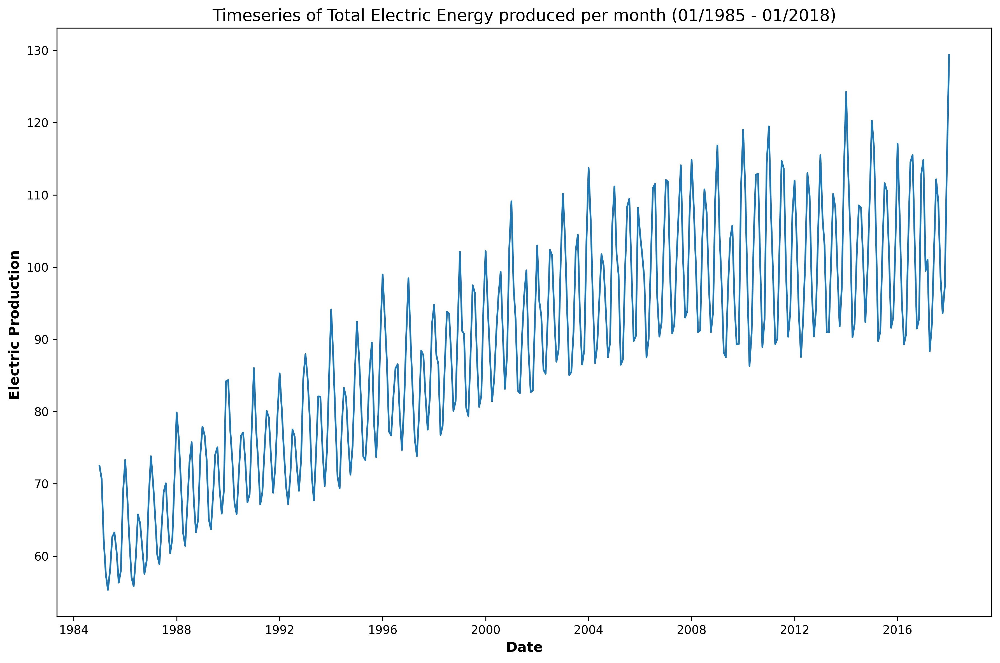

In [ ]:
# plot of energy producted through time
plt.figure(figsize=(12,8), dpi=300)
plt.plot(df.energy)
plt.xlabel('Date', size = 12,fontweight='bold')
plt.ylabel('Electric Production ',fontweight='bold', size = 12)
plt.title('Timeseries of Total Electric Energy produced per month (01/1985 - 01/2018)', size = 14)
plt.tight_layout()
#plt.savefig("timeseries.pdf")
#files.download("timeseries.pdf") 
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

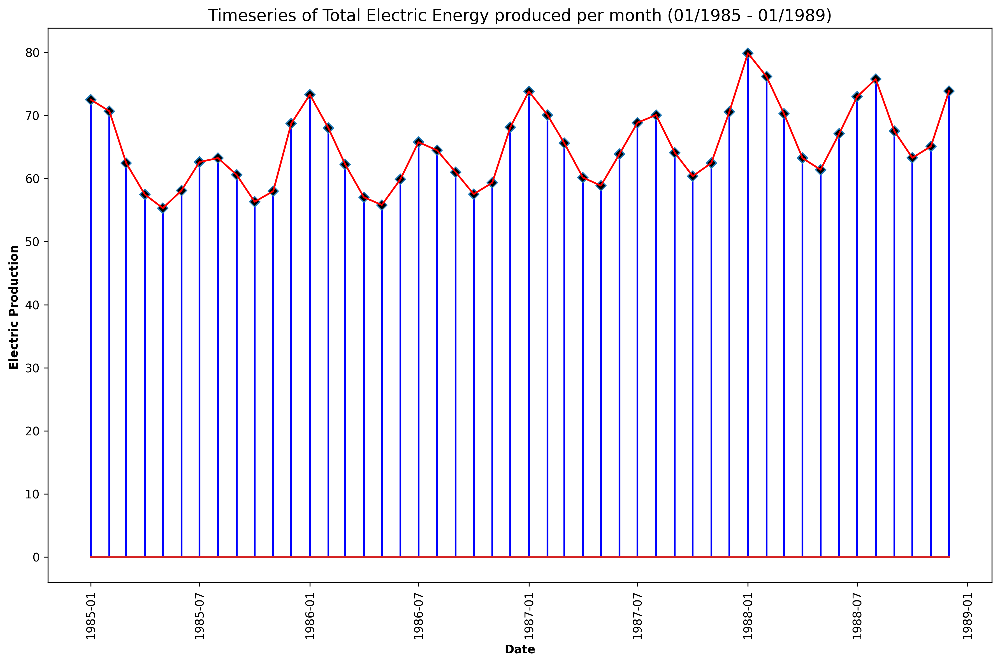

In [ ]:
# plot of energy producted through time
plt.figure(figsize=(12,8), dpi=300)

markerline, stemlines, baseline = plt.stem(
    df.energy.index[0:48],df.energy[:48], linefmt ='blue', markerfmt ='D',
    bottom = 0, use_line_collection = True)
plt.plot(df.energy[:48],color='red')
markerline.set_markerfacecolor('k')
plt.xticks(rotation=90)
plt.xlabel('Date',fontweight='bold')
plt.ylabel('Electric Production ',fontweight='bold')
plt.title('Timeseries of Total Electric Energy produced per month (01/1985 - 01/1989)', size = 14)
plt.tight_layout()
#plt.savefig("stemtimeseries.pdf")
#files.download("stemtimeseries.pdf") 
plt.show()

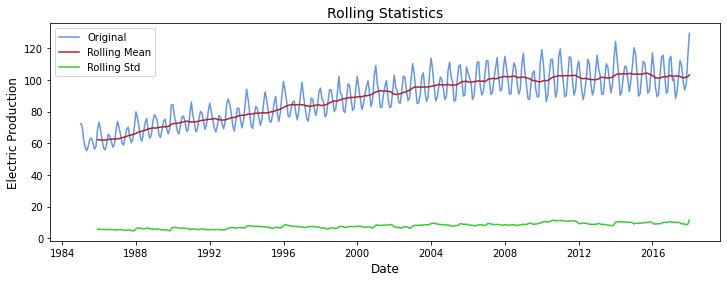

In [ ]:
rolling_mean = df.rolling(window=12).mean()
rolling_std = df.rolling(window=12).std()
plt.figure(figsize = (12,4))
plt.plot(df.energy, color='cornflowerblue', label='Original')
plt.plot(rolling_mean, color='firebrick', label='Rolling Mean')
plt.plot(rolling_std, color='limegreen', label='Rolling Std')
plt.xlabel('Date', size = 12)
plt.ylabel('Electric Production', size  = 12)
plt.legend(loc = 'upper left')
plt.title('Rolling Statistics', size = 14)
plt.show()


TIMESERIES'S HISTOGRAMS
---


---



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

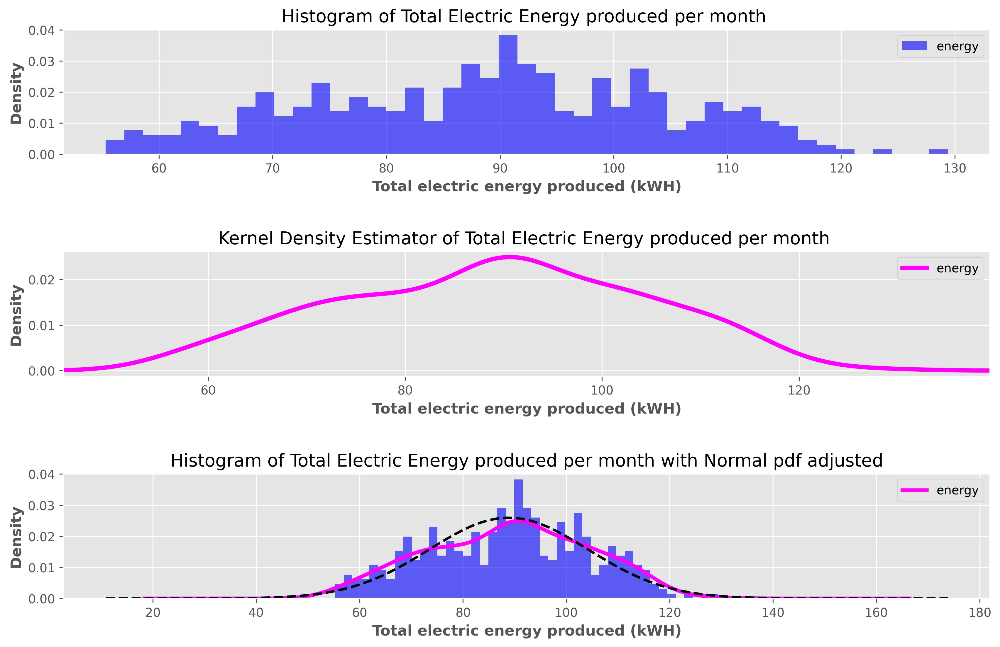

In [ ]:
import numpy as np
from scipy.stats import norm
# histogram - kernel density estimator on real values
plt.figure(figsize=(12,8), dpi=300)
plt.subplot(311)
plt.style.use('ggplot')
df.energy.plot.hist( color = 'blue',alpha=0.6,density=True,bins=45)
plt.ylabel("Density",fontweight='bold')
plt.xlabel("Total electric energy produced (kWH)",fontweight='bold')
plt.ylim()
#plt.xlim(df.energy.min()-40,df.energy.max()+10)
plt.legend(loc='best')
plt.title("Histogram of Total Electric Energy produced per month ")
plt.tight_layout(pad=3.0)
#create density plot
plt.subplot(312)
plt.style.use('ggplot')
df.energy.plot.kde(color='magenta',linewidth=3.5)
plt.xlim(df.energy.min()-10,df.energy.max()+10)
plt.ylabel("Density",fontweight='bold')
plt.xlabel("Total electric energy produced (kWH)",fontweight='bold')
plt.legend(loc='best')
plt.title("Kernel Density Estimator of Total Electric Energy produced per month ")
plt.tight_layout(pad=3.0)
plt.subplot(313)
plt.style.use('ggplot')
#plot KDE
df.energy.plot.kde(color='magenta',linewidth=3)
data = df.energy  
mu, sigma = norm.fit(data) 
# Plot the histogram.
plt.hist(data, density=True, alpha=0.6, color='blue',bins=45)
# Plot the normalPDF.
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, sigma)  
plt.plot(x, p,'--', color='black', linewidth=2)

plt.ylabel("Density",fontweight='bold')
plt.xlabel("Total electric energy produced (kWH)",fontweight='bold')
plt.legend(loc='best')
plt.title("Histogram of Total Electric Energy produced per month with Normal pdf adjusted")
plt.tight_layout(pad=3.0)
#plt.savefig("originalscalehist.pdf")
#files.download("originalscalehist.pdf") 
plt.show()



Reviewing plots of the density of observations can provide further insight into the structure of the data:


---
---

1.   The distribution is not perfectly Gaussian, so we can't still use our ARIMA-SARIMA models. 

2.   The distribution has two peaks.

3.   Transformations might be useful prior to modelling.

---
---






FITTED DISTRIBUTION
---



---



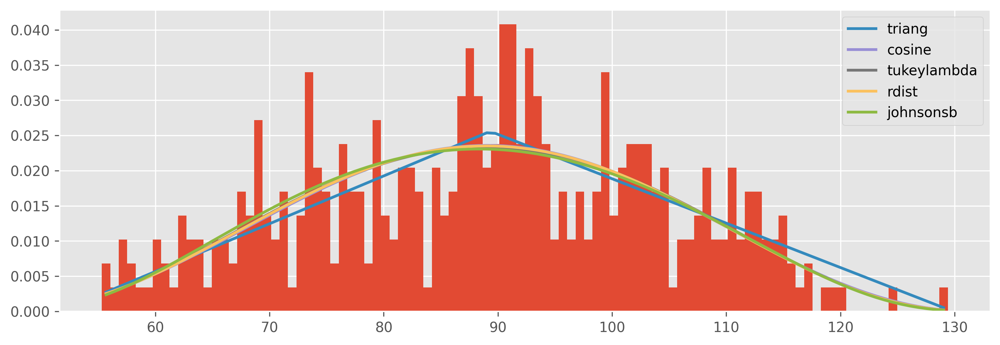

In [ ]:
#fitting distirbution to data
ans=df["energy"].values
# We then create the Fitter object
f=Fitter(ans)
plt.figure(figsize=(12,4),dpi=300)
#Loop over distributions and find best parameter to fit the data for each
f.fit()
#Plots the distribution of the data and N=5 best distribution
f.summary()
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

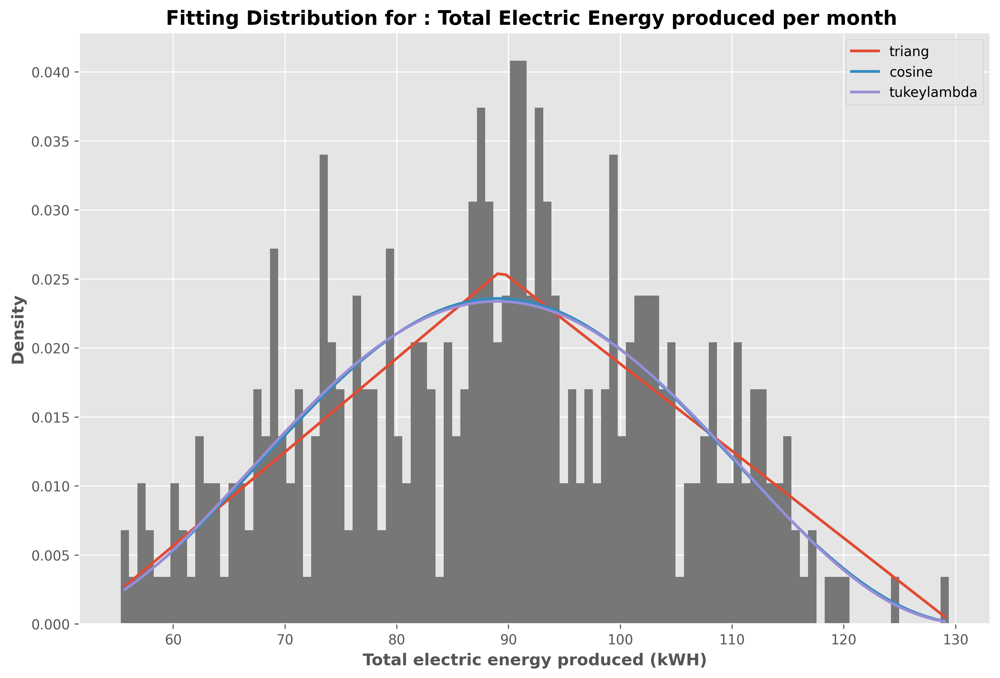

In [ ]:
#Return best fitted distribution and its parameters
f.get_best(method = 'sumsquare_error')
#identifying the parameters of best pdf
f.fitted_param["triang"]
#visualization of best distributions for datas
plt.figure(figsize=(12,8),dpi=300)
plt.style.use('ggplot')
#Plots Probability density functions of the distributions
f.plot_pdf(names=None, Nbest=3, lw=2, method='sumsquare_error')
f.hist()
plt.ylabel("Density",fontweight='bold')
plt.xlabel("Total electric energy produced (kWH)",fontweight='bold')
plt.legend(loc='best')
plt.title("Fitting Distribution for : Total Electric Energy produced per month ",fontweight='bold')
#plt.savefig("tsfit.pdf")
#files.download("tsfit.pdf") 
plt.show()



 DECOMPOSITION PLOT 
 ---


---





<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

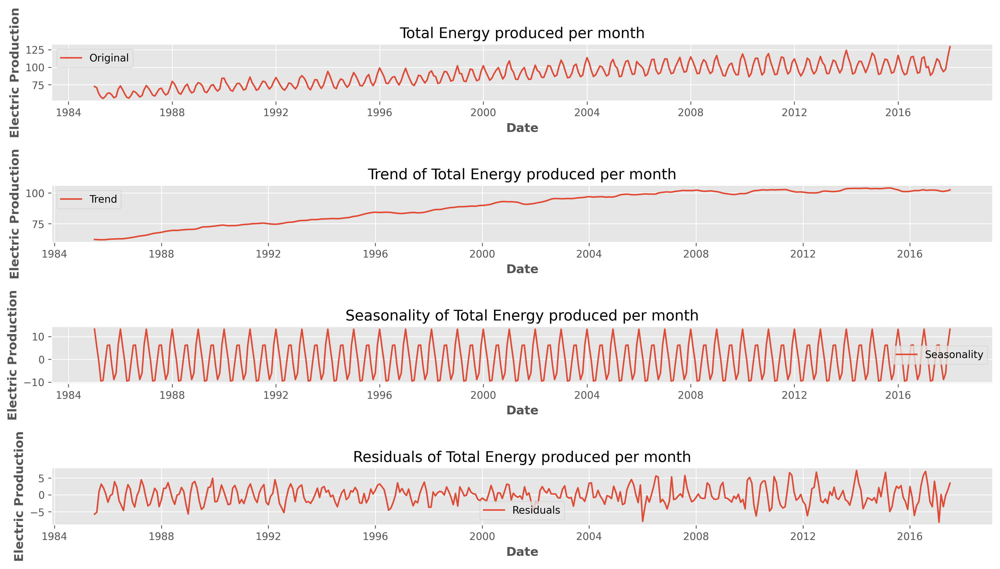

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARMA, ARIMA
# naive decomposition

decomposition = seasonal_decompose(df.energy)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid


plt.figure(figsize=(14,8),dpi=300)

plt.subplot(411)
plt.plot(df.energy, label='Original')
plt.title("Total Energy produced per month")
plt.ylabel("Electric Production",fontweight='bold')
plt.xlabel("Date",fontweight='bold')
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout(pad=2)

plt.subplot(412)
plt.plot(trend, label='Trend')
plt.title("Trend of Total Energy produced per month")
plt.ylabel("Electric Production",fontweight='bold')
plt.xlabel("Date",fontweight='bold')
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout(pad=2)

plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.title("Seasonality of Total Energy produced per month")
plt.ylabel("Electric Production",fontweight='bold')
plt.xlabel("Date",fontweight='bold')
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout(pad=2)

plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.title("Residuals of Total Energy produced per month")
plt.ylabel("Electric Production",fontweight='bold')
plt.xlabel("Date",fontweight='bold')
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout(pad=2)

#plt.savefig("ts_decompose.pdf")
#files.download("ts_decompose.pdf") 

plt.show()

Augmented Dickey-Fuller Test
---

---



Augmented Dickey-Fuller Test

Augmented Dickey-Fuller Test is a common statistical test used to test whether a given time series is stationary or not. We can achieve this by defining the null and alternate hypothesis.

Null Hypothesis: Time Series is non-stationary. It gives a time-dependent trend.
Alternate Hypothesis: Time Series is stationary. In another term, the series doesn’t depend on time.

ADF or t Statistic < critical values: Reject the null hypothesis, time series is stationary.
ADF or t Statistic > critical values: Failed to reject the null hypothesis, time series is non-stationary.


In [ ]:
from statsmodels.tsa.stattools import adfuller
def adfuller_test(ts):
  #Perform Dickey-Fuller test:
  adf = adfuller(ts, autolag='AIC')
    
  print(f'ADF Statistic: {round(adf[0],3)}')
  print(f'p-value: {round(adf[1],12)}')
  print("##################################")  
  
    
  for key, value in adf[4].items():
    print('Critial Values:')
    print(f'   {key}, {round(value,3)}')  
  print("##################################")
  
  if adf[0] > adf[4]["5%"] or adf[0] > adf[4]["5%"] or adf[0] > adf[4]["1%"]:
    print("ADF > Critial Values")
    print ("Failed to reject null hypothesis, time series is non-stationary.")
  else:
    print("ADF < Critical Values")
    limit=0.05
    if adf[1] < limit :
      print("p-value < 0.05")
      print("Reject null hypothesis, time series is stationary.")

        
adfuller_test(df.energy)

ADF Statistic: -2.257
p-value: 0.186214691166
##################################
Critial Values:
   1%, -3.448
Critial Values:
   5%, -2.869
Critial Values:
   10%, -2.571
##################################
ADF > Critial Values
Failed to reject null hypothesis, time series is non-stationary.




The p-value is obtained is greater than significance level of 0.05 and the ADF statistic is higher than any of the critical values.

Clearly, there is no reason to reject the null hypothesis. So, the time series is in fact non-stationary.


 ACF - PACF PLOTS 
 ---


---


Let's review the Autocorrelation Function (ACF) and Partial Autocorrelation Function (PACF) plots :

---
---
* If the time series is stationary, the ACF/PACF 
plots will show a quick drop-off in correlation after a small amount of lag between points.


* AR(1) process -- has ACF tailing out and PACF cutting off at lag=1


* AR(2) process -- has ACF tailing out and PACF cutting off at lag=2


* MA(1) process -- has ACF cut off at lag=1


* MA(2) process -- has ACF cut off at lag=2


---
---








Looking ACF shape:



---
---

*  If exponential, decaying to zero, then Autoregressive model. Use the partial autocorrelation plot to identify the order of the autoregressive model
*  If no decay to zero:
  Series is not stationary

*  If high values at fixed intervals 	indicate model that includes seasonal autoregressive term.

*  If all zero or close to zero indicates that	data are essentially random

*  If decay, starting after a few lags, then mixed autoregressive and moving average (ARMA) model.

* If exist only one or more spikes and rest are essentially zero then
moving average model, order identified by where plot becomes zero.

*   Alternating positive and negative, decaying to zero Autoregressive model. Then use the partial autocorrelation plot to help identify the order.

---
---








<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

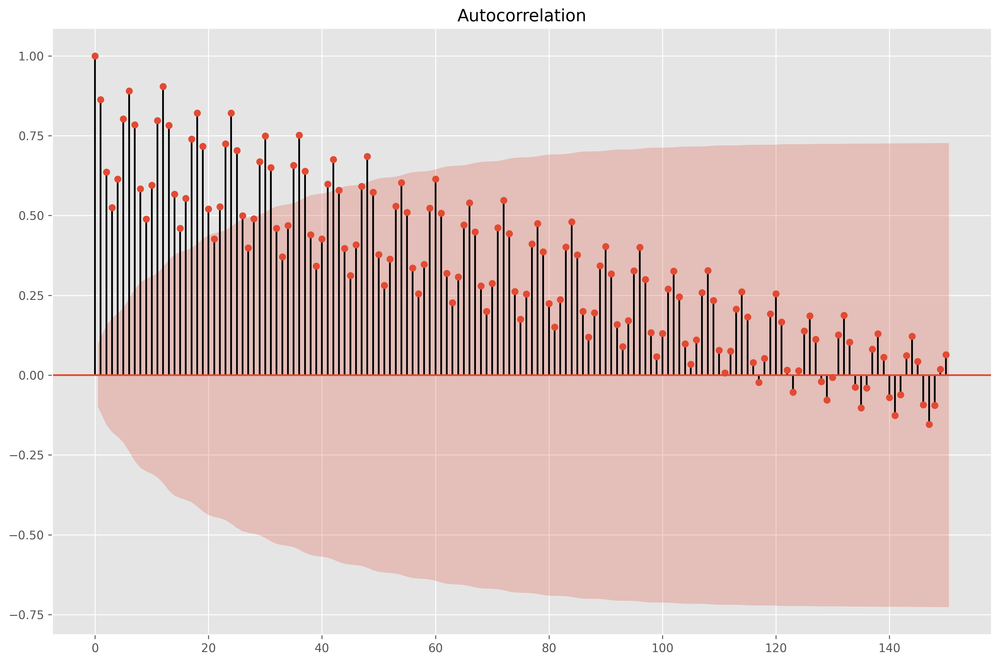

In [ ]:
plt.figure(figsize=(12,8),dpi=300)

plot_acf(df.energy, ax=plt.gca(),lags=150)
plt.style.use('ggplot')
plt.tight_layout()
plt.style.use('ggplot')
plt.tight_layout()
#plt.savefig("acforiginal150.pdf")
#files.download("acforiginal150.pdf") 
plt.show()

---
---
# DATA TRANSFORMATION



---
---

POWER TRANSFORMATIONS TO MAKE DATA STATIONARY:
---

1.   LOG 
2.   SQUARE ROOT
3.   RECIPROCAL
4.   RECIPROCAL SQUARE ROOT
5.   QUBE ROOT 


 The Box-Cox transform is a configurable data transform method that supports
both square root and log transform, as well as a suite of related transforms.
More than that, it can be configured to evaluate a suite of transforms automatically and select a best fit. It can be thought of as a power tool to iron out power-based change in your time series. The resulting series may be more linear and the resulting distribution more Gaussian or Uniform, depending on the underlying process that generated it. The scipy.stats library provides an implementation of the Box-Cox transform. The boxcox() function3 takes an argument, called lambda, that controls the type of transform to perform. Below are some common values for lambda:
- lambda = -1.0 is a reciprocal transform.
- lambda = -0.5 is a reciprocal square - root transform.
- lambda = 0.0 is a log transform.
- lambda = 0.5 is a square root transform.
- lambda = 1.0 is no transform

BOX COX TRANSFORMATION
---

In [7]:
from scipy.stats import boxcox
#make copy of my original timeserie
dft=df.copy()
#use box cox to make specific transforms according to lamda
dft['log']=boxcox(dft['energy'],lmbda=0.0)
dft['sqr']=boxcox(dft['energy'],lmbda=0.5)
dft['rec_sqr']=boxcox(dft['energy'],lmbda=-0.5)
dft['rec']=boxcox(dft['energy'],lmbda=-1.0)
#qube root transformation
dft["cuber"]=np.cbrt(dft["energy"])
dft['bc'], lam = boxcox(dft['energy'])
print('Lambda: %f' % lam)

Lambda: 1.074835


LOG TRANSFORMATION AND PLOTS 
---

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

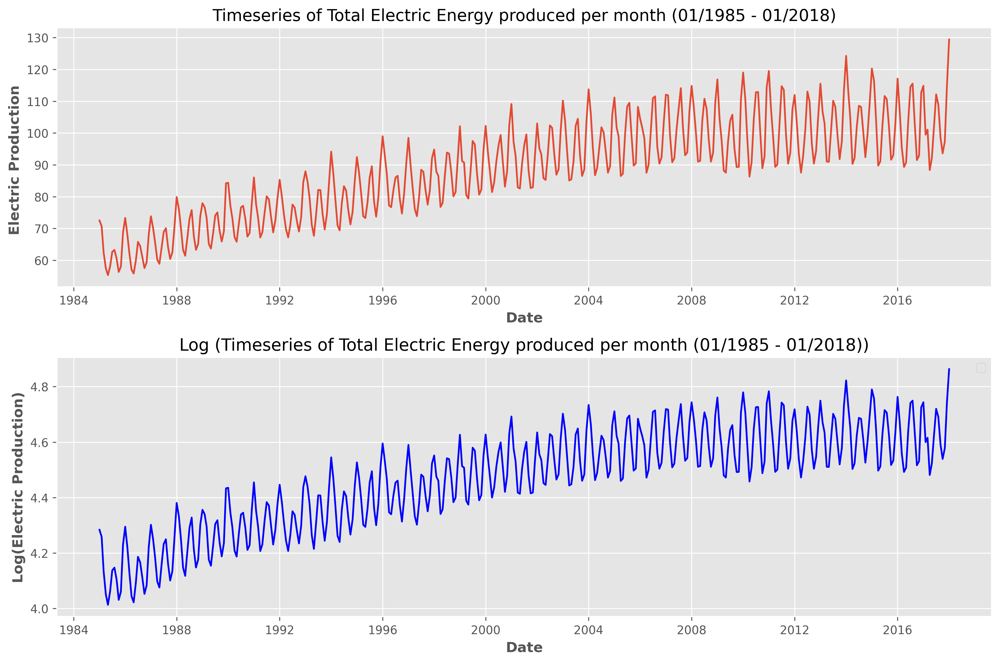

In [ ]:
#after log transform
plt.figure(figsize=(12,8),dpi=300)
# line plot
plt.subplot(211)
plt.plot(df.energy)
plt.xlabel('Date', size = 12,fontweight='bold')
plt.ylabel('Electric Production ',fontweight='bold', size = 12)
plt.title('Timeseries of Total Electric Energy produced per month (01/1985 - 01/2018)', size = 14)
plt.tight_layout()
plt.subplot(212)
plt.plot(dft.log,color='blue')
plt.ylabel("Log(Electric Production)",fontweight='bold', size = 12)
plt.xlabel("Date",fontweight='bold', size = 12)
plt.legend(loc='best')
plt.title("Log (Timeseries of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()
plt.savefig("logts.pdf")
files.download("logts.pdf")
plt.show()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

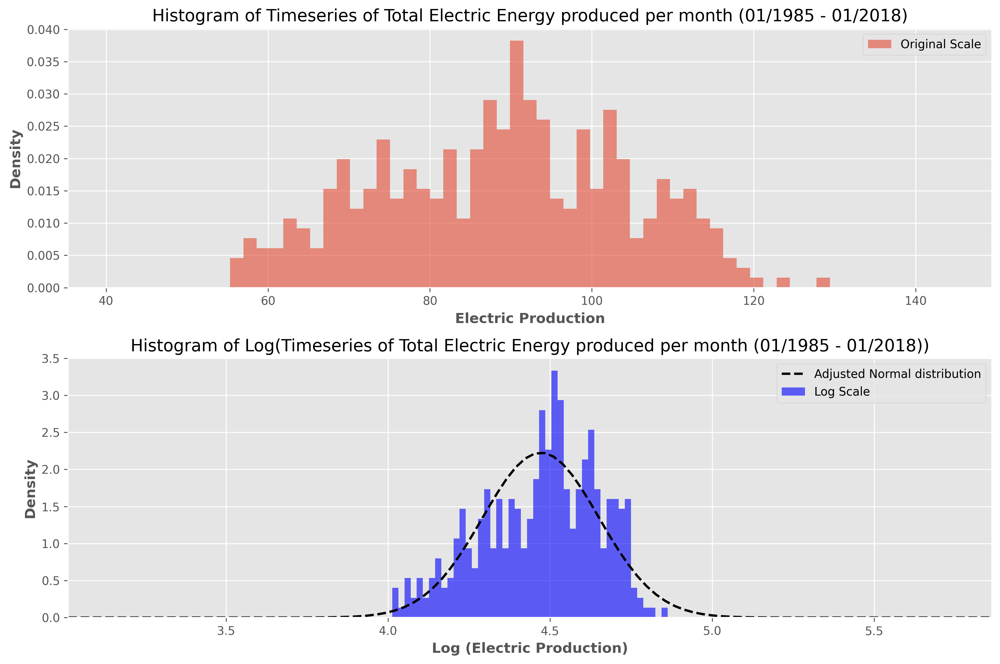

In [ ]:
import numpy as np
from scipy.stats import norm
plt.figure(figsize=(12,8),dpi=300)
plt.subplot(211)
plt.style.use('ggplot')
df.energy.plot.hist(alpha=0.6,density=True,bins=45,label= 'Original Scale')
plt.ylabel("Density",fontweight='bold', size = 12)
plt.xlabel("Electric Production",fontweight='bold', size = 12)
plt.xlim(dft.energy.min()-20,dft.energy.max()+20)
plt.legend(loc='best')
plt.title("Histogram of Timeseries of Total Electric Energy produced per month (01/1985 - 01/2018)")
plt.tight_layout()

plt.subplot(212)
plt.style.use('ggplot')
dft.log.plot.hist(bins=45,color='blue',alpha=0.6,density=True,label='Log Scale')
plt.ylabel("Density",fontweight='bold', size = 12)
plt.xlabel("Log (Electric Production)",fontweight='bold', size = 12)
plt.xlim(dft.log.min()-1,dft.log.max()+1)
data = dft.log  
mu, sigma = norm.fit(data)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, sigma)  
plt.plot(x, p,'--', color='black', linewidth=2,label='Adjusted Normal distribution')
plt.legend(loc='best')
plt.title("Histogram of Log(Timeseries of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()
plt.savefig("hist_logts.pdf")
files.download("hist_logts.pdf") 
plt.show()
 

No handles with labels found to put in legend.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

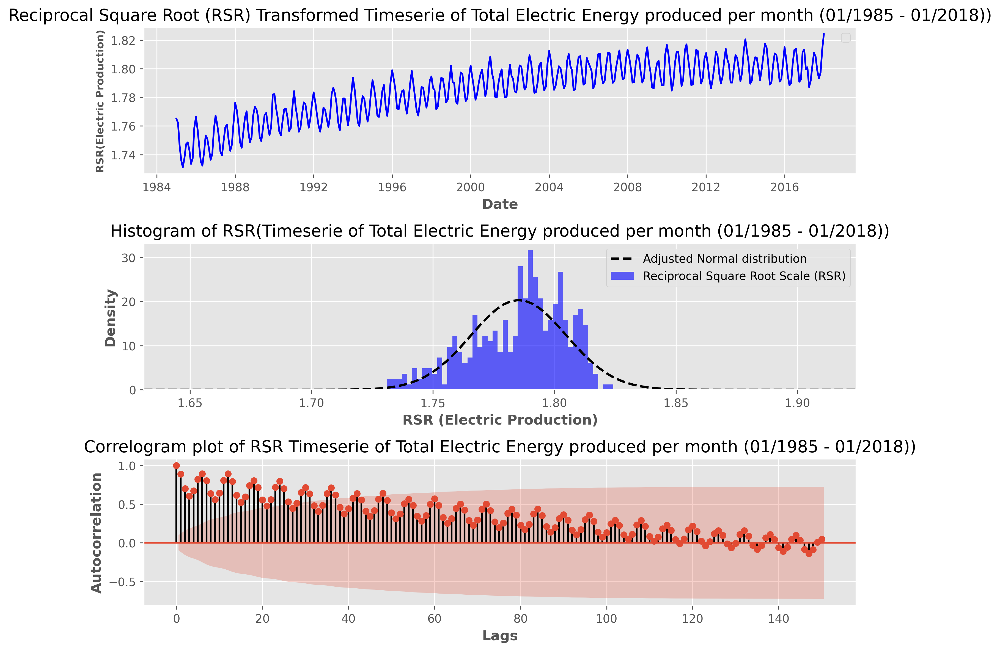

In [ ]:
import numpy as np
from scipy.stats import norm
plt.figure(figsize=(12,8),dpi=300)
plt.subplot(311)
plt.style.use('ggplot')
plt.plot(dft['rec_sqr'],color='blue')
plt.ylabel("RSR(Electric Production)",fontweight='bold', size = 9)
plt.xlabel("Date",fontweight='bold', size = 12)
plt.legend(loc='best')
plt.title("Reciprocal Square Root (RSR) Transformed Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

plt.subplot(312)
plt.style.use('ggplot')
dft['rec_sqr'].plot.hist(bins=45,color='blue',alpha=0.6,density=True,label='Reciprocal Square Root Scale (RSR)')
plt.ylabel("Density",fontweight='bold', size = 12)
plt.xlabel("RSR (Electric Production)",fontweight='bold', size = 12)
plt.xlim(dft['rec_sqr'].min()-0.1,dft['rec_sqr'].max()+0.1)
data = dft['rec_sqr']
  
mu, sigma = norm.fit(data)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, sigma)  
plt.plot(x, p,'--', color='black', linewidth=2,label='Adjusted Normal distribution')
plt.legend(loc='best')
plt.title("Histogram of RSR(Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

plt.subplot(313)
plot_acf(dft['rec_sqr'], ax=plt.gca(),lags=150)
plt.style.use('ggplot')
plt.ylabel("Autocorrelation",fontweight='bold', size = 12)
plt.xlabel("Lags",fontweight='bold', size = 12)
plt.title("Correlogram plot of RSR Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

plt.savefig("rec_sq_ts.pdf")
files.download("rec_sq_ts.pdf") 
plt.show()

SQUARE ROOT TRANSFORMATION AND PLOTS
---

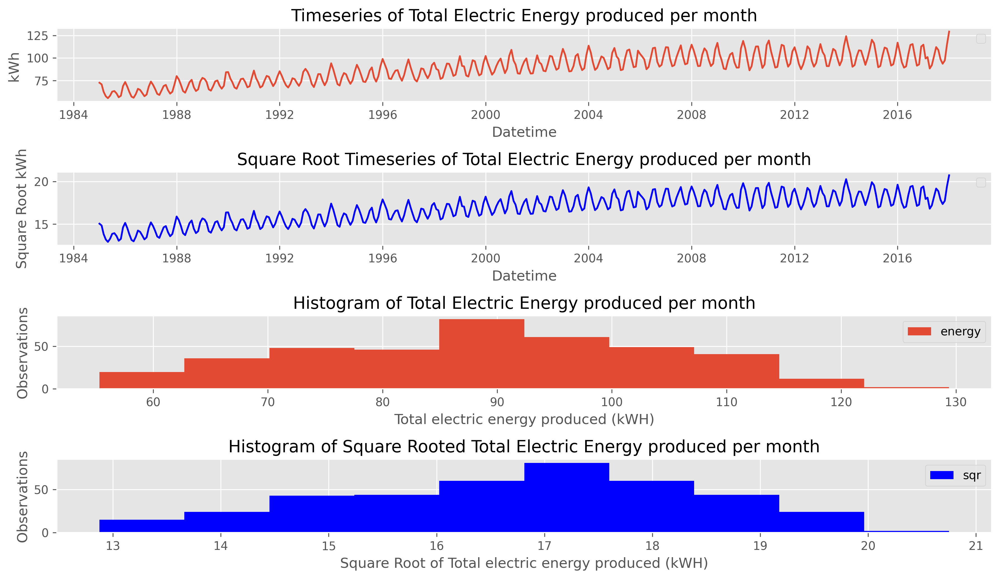

In [ ]:
#after square root transform
plt.figure(figsize=(12,8),dpi=300)
# line plot
plt.subplot(411)
plt.plot(dft.energy)
plt.ylabel("kWh ")
plt.xlabel("Datetime")
plt.legend(loc='best')
plt.title("Timeseries of Total Electric Energy produced per month")
plt.tight_layout()


plt.subplot(412)
plt.plot(dft.sqr,color='blue')
plt.ylabel("Square Root kWh")
plt.xlabel("Datetime")
plt.legend(loc='best')
plt.title("Square Root Timeseries of Total Electric Energy produced per month")
plt.tight_layout()

plt.subplot(413)
plt.style.use('ggplot')
df.energy.plot.hist(bins=10)
plt.ylabel("Observations")
plt.xlabel("Total electric energy produced (kWH)")
#plt.xlim(dft.energy.min(),dft.energy.max())
plt.legend(loc='best')
plt.title("Histogram of Total Electric Energy produced per month")
plt.tight_layout()


plt.subplot(414)
plt.style.use('ggplot')
dft.sqr.plot.hist(bins=10,color='blue')
plt.ylabel("Observations")
plt.xlabel("Square Root of Total electric energy produced (kWH)")
#plt.xlim(dft.sqr.min(),dft.sqr.max())
plt.legend(loc='best')
plt.title("Histogram of Square Rooted Total Electric Energy produced per month")
plt.tight_layout()
#plt.savefig("dailyloghist.pdf")
#files.download("dailyloghist.pdf") 
plt.show()



RECIPROCAL TRANSFORM AND PLOTS
---

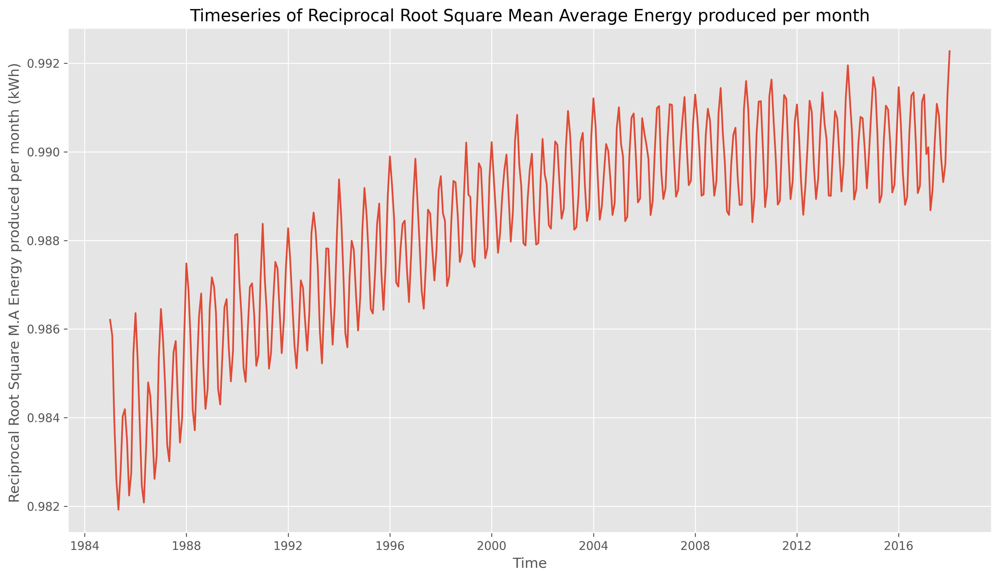

<Figure size 3600x2400 with 0 Axes>

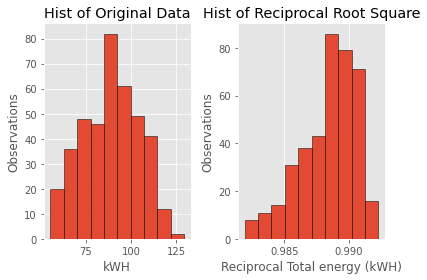

In [ ]:
#after RECIPROCAL quadratic transform
plt.figure(figsize=(12,7),dpi=300)
# line plot
plt.plot(dft['rec'])
plt.ylabel("Reciprocal Root Square M.A Energy produced per month (kWh) ")
plt.xlabel("Time")
plt.title("Timeseries of Reciprocal  Mean Average Energy produced per month")
plt.tight_layout()
# plt.savefig("dailyreqsq.pdf")
# files.download("dailyreqsq.pdf")
plt.show()
# histogram
plt.figure(figsize=(12,8),dpi=300)
plt.style.use('ggplot')
fig, axs = plt.subplots(nrows=1, ncols=2)
#create histograms
axs[0].hist(dft['energy'], edgecolor='black',bins=10)#,density=True
axs[1].hist(dft['rec'], edgecolor='black',bins=10)
#add title to each histogram
axs[0].set_title('Hist of Original Data')
axs[0].set_xlabel('kWH')
axs[0].set_ylabel('Observations')
axs[1].set_title('Hist of Reciprocal Root Square')
axs[1].set_xlabel('Reciprocal Total energy (kWH)')
axs[1].set_ylabel('Observations')
plt.grid(axis='y')
plt.tight_layout()
# plt.savefig("dailyrecsqhist.pdf")
# files.download("dailyrecsqhist.pdf") 
plt.show()

RECIPROCAL SQUARE TRANSFORM AND PLOTS
---

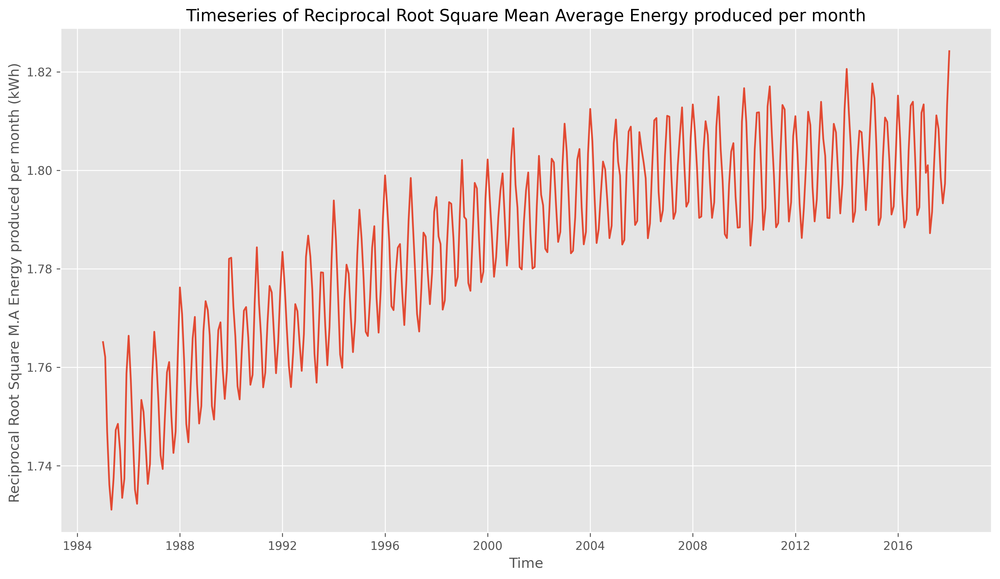

<Figure size 3600x2400 with 0 Axes>

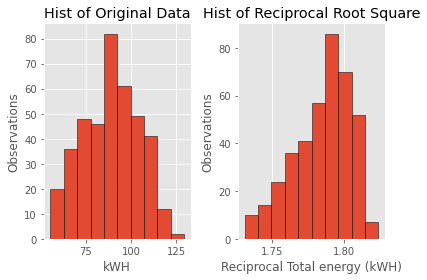

In [ ]:
#after RECIPROCAL quadratic transform
plt.figure(figsize=(12,7),dpi=300)
# line plot
plt.plot(dft['rec_sqr'])
plt.ylabel("Reciprocal Root Square M.A Energy produced per month (kWh) ")
plt.xlabel("Time")
plt.title("Timeseries of Reciprocal Root Square Mean Average Energy produced per month")
plt.tight_layout()
# plt.savefig("dailyreqsq.pdf")
# files.download("dailyreqsq.pdf")
plt.show()
# histogram
plt.figure(figsize=(12,8),dpi=300)
plt.style.use('ggplot')
fig, axs = plt.subplots(nrows=1, ncols=2)
#create histograms
axs[0].hist(dft['energy'], edgecolor='black',bins=10)#,density=True
axs[1].hist(dft['rec_sqr'], edgecolor='black',bins=10)
#add title to each histogram
axs[0].set_title('Hist of Original Data')
axs[0].set_xlabel('kWH')
axs[0].set_ylabel('Observations')
axs[1].set_title('Hist of Reciprocal Root Square')
axs[1].set_xlabel('Reciprocal Total energy (kWH)')
axs[1].set_ylabel('Observations')
plt.grid(axis='y')
plt.tight_layout()
# plt.savefig("dailyrecsqhist.pdf")
# files.download("dailyrecsqhist.pdf") 
plt.show()

CUBE ROOT TRANSFORMATION AND PLOTS
---

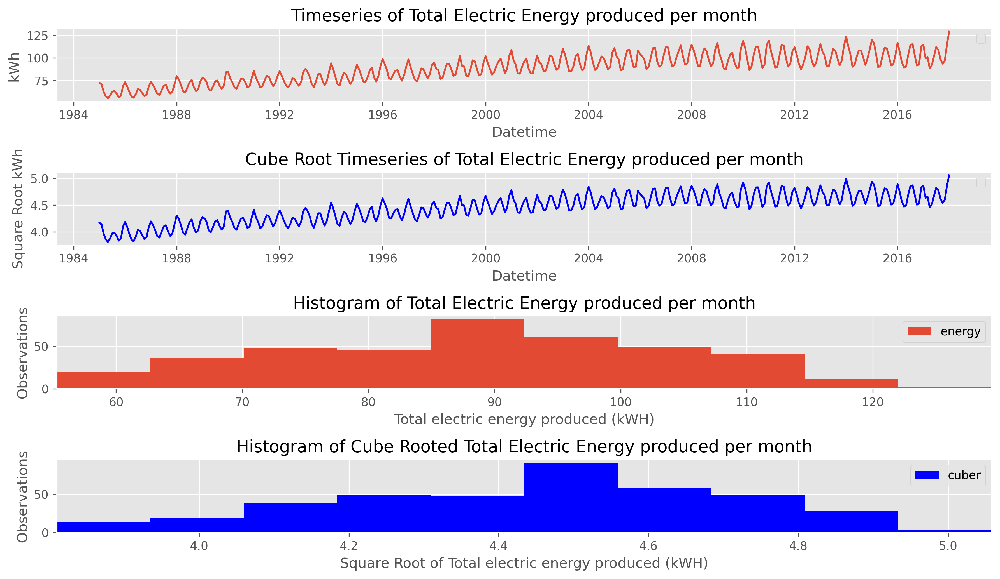

In [ ]:
#after square root transform
plt.figure(figsize=(12,7),dpi=300)
# line plot
plt.subplot(411)
plt.plot(dft.energy)
plt.ylabel("kWh ")
plt.xlabel("Datetime")
plt.legend(loc='best')
plt.title("Timeseries of Total Electric Energy produced per month")
plt.tight_layout()


plt.subplot(412)
plt.plot(dft.cuber,color='blue')
plt.ylabel("Square Root kWh")
plt.xlabel("Datetime")
plt.legend(loc='best')
plt.title("Cube Root Timeseries of Total Electric Energy produced per month")
plt.tight_layout()

plt.subplot(413)
plt.style.use('ggplot')
df.energy.plot.hist(bins=10)
plt.ylabel("Observations")
plt.xlabel("Total electric energy produced (kWH)")
plt.xlim(dft.energy.min(),dft.energy.max())
plt.legend(loc='best')
plt.title("Histogram of Total Electric Energy produced per month")
plt.tight_layout()


plt.subplot(414)
plt.style.use('ggplot')
dft.cuber.plot.hist(bins=10,color='blue')
plt.ylabel("Observations")
plt.xlabel("Square Root of Total electric energy produced (kWH)")
plt.xlim(dft.cuber.min(),dft.cuber.max())
plt.legend(loc='best')
plt.title("Histogram of Cube Rooted Total Electric Energy produced per month")
plt.tight_layout()
#plt.savefig("dailyloghist.pdf")
#files.download("dailyloghist.pdf") 
plt.show()



AUTO BOXCOX TRANSFORAMTION AND PLOTS
--

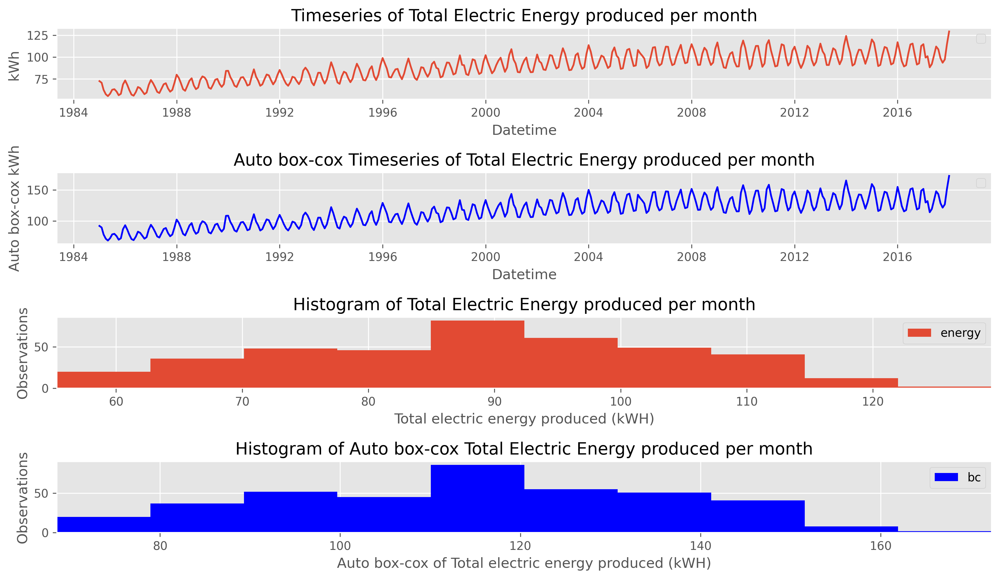

In [ ]:
#after square root transform
plt.figure(figsize=(12,7),dpi=300)
# line plot
plt.subplot(411)
plt.plot(dft.energy)
plt.ylabel("kWh ")
plt.xlabel("Datetime")
plt.legend(loc='best')
plt.title("Timeseries of Total Electric Energy produced per month")
plt.tight_layout()


plt.subplot(412)
plt.plot(dft.bc,color='blue')
plt.ylabel("Auto box-cox kWh")
plt.xlabel("Datetime")
plt.legend(loc='best')
plt.title("Auto box-cox Timeseries of Total Electric Energy produced per month")
plt.tight_layout()

plt.subplot(413)
plt.style.use('ggplot')
df.energy.plot.hist(bins=10)
plt.ylabel("Observations")
plt.xlabel("Total electric energy produced (kWH)")
plt.xlim(dft.energy.min(),dft.energy.max())
plt.legend(loc='best')
plt.title("Histogram of Total Electric Energy produced per month")
plt.tight_layout()


plt.subplot(414)
plt.style.use('ggplot')
dft.bc.plot.hist(bins=10,color='blue')
plt.ylabel("Observations")
plt.xlabel("Auto box-cox of Total electric energy produced (kWH)")
plt.xlim(dft.bc.min(),dft.bc.max())
plt.legend(loc='best')
plt.title("Histogram of Auto box-cox Total Electric Energy produced per month")
plt.tight_layout()
#plt.savefig("dailyloghist.pdf")
#files.download("dailyloghist.pdf") 
plt.show()



ALL HISTOGRAMS OF TRANSFORMED DATA 
--

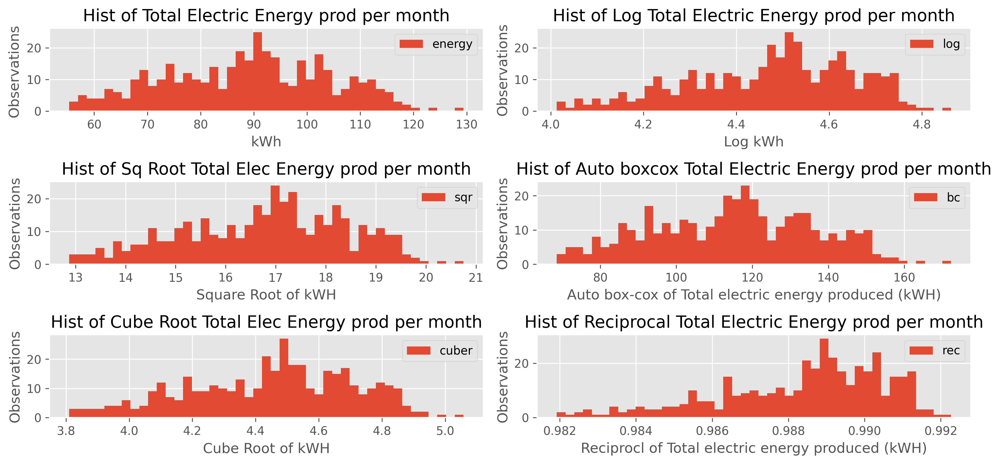

In [ ]:
#histograms after transforming



plt.figure(figsize=(12,7),dpi=300)
# line plot
plt.subplot(421)
dft.energy.plot.hist(bins=45)
plt.ylabel("Observations ")
plt.xlabel("kWh")
plt.legend(loc='best')
plt.title("Hist of Total Electric Energy prod per month")
plt.tight_layout()


plt.subplot(422)
dft.log.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Log kWh")
plt.legend(loc='best')
plt.title("Hist of Log Total Electric Energy prod per month")
plt.tight_layout()

plt.subplot(423)
plt.style.use('ggplot')
dft.sqr.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Square Root of kWH")
plt.legend(loc='best')
plt.title("Hist of Sq Root Total Elec Energy prod per month")
plt.tight_layout()


plt.subplot(424)
plt.style.use('ggplot')
dft.bc.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Auto box-cox of Total electric energy produced (kWH)")
plt.legend(loc='best')
plt.title("Hist of Auto boxcox Total Electric Energy prod per month")

plt.subplot(425)
plt.style.use('ggplot')
dft.cuber.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Cube Root of kWH")
plt.legend(loc='best')
plt.title("Hist of Cube Root Total Elec Energy prod per month")
plt.tight_layout()


plt.subplot(426)
plt.style.use('ggplot')
dft.rec.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Reciprocl of Total electric energy produced (kWH)")
plt.legend(loc='best')
plt.title("Hist of Reciprocal Total Electric Energy prod per month")
plt.tight_layout()
#plt.savefig("dailyloghist.pdf")
#files.download("dailyloghist.pdf") 
plt.show()



TEST STATIONARITY AGAIN AFTER TRANSFORMING
--

In [ ]:
print("Log Transformation ADF test: \n")
adfuller_test(dft['log'])
print("---------------------\n")
print("Square Root Transformation ADF test:: \n")
adfuller_test(dft['sqr'])
print("---------------------\n")
print("Reciprocal Square root Transformation ADF test:: \n")
adfuller_test(dft['rec_sqr'])
print("---------------------\n")
print("Reciprocal Transformation ADF test: \n")
adfuller_test(dft['rec'])
print("---------------------\n")
print("Cube Root Transformation ADF test: \n")
adfuller_test(dft['cuber'])
print("Auto Box-Cox Transformation ADF test: \n")
adfuller_test(dft['bc'])

Log Transformation ADF test: 

ADF Statistic: -3.145
p-value: 0.023373401033
##################################
Critial Values:
   1%, -3.448
Critial Values:
   5%, -2.869
Critial Values:
   10%, -2.571
##################################
ADF > Critial Values
Failed to reject null hypothesis, time series is non-stationary.
---------------------

Square Root Transformation ADF test:: 

ADF Statistic: -2.687
p-value: 0.076252340647
##################################
Critial Values:
   1%, -3.448
Critial Values:
   5%, -2.869
Critial Values:
   10%, -2.571
##################################
ADF > Critial Values
Failed to reject null hypothesis, time series is non-stationary.
---------------------

Reciprocal Square root Transformation ADF test:: 

ADF Statistic: -3.617
p-value: 0.005451781722
##################################
Critial Values:
   1%, -3.448
Critial Values:
   5%, -2.869
Critial Values:
   10%, -2.571
##################################
ADF < Critical Values
p-value < 0.05
Re

ALL HISTOGRAMS OF TRANSFORMED- DIFFERENCED(1) DATA
--

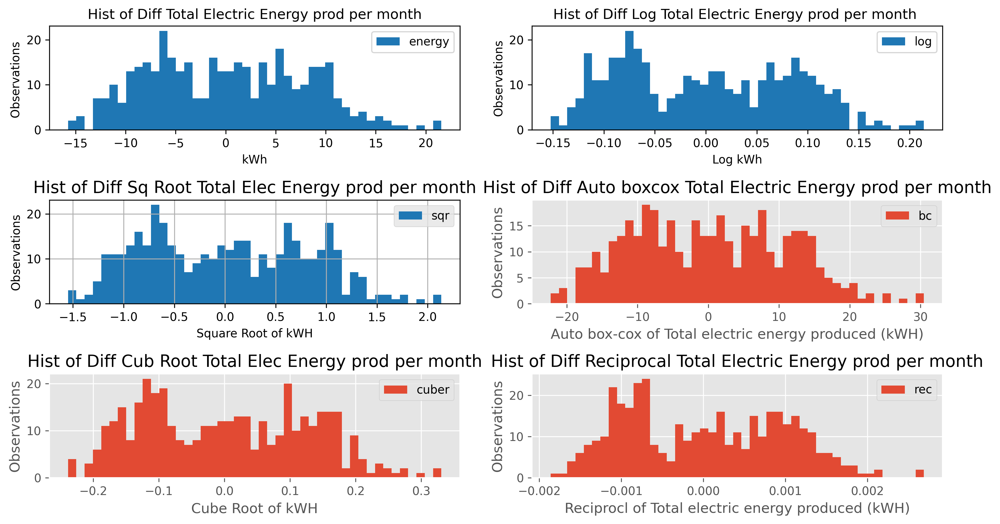

In [ ]:
#histograms after differencing
d=dft.copy()


d['energy']=dft['energy'].diff().dropna()
d['log']=dft['log'].diff().dropna()
d['sqr']=dft['sqr'].diff().dropna()
d['rec_sqr']=dft['rec_sqr'].diff().dropna()
d['rec']=dft['rec'].diff().dropna()
#qube root transformation
d["cuber"]=dft["cuber"].diff().dropna()
d['bc']=dft['bc'].diff().dropna()
d=d.drop(d.index[0])#drop first nan line

plt.figure(figsize=(12,8),dpi=300)
# line plot
plt.subplot(421)
d.energy.plot.hist(bins=45)
plt.ylabel("Observations ")
plt.xlabel("kWh")
plt.legend(loc='best')
plt.title("Hist of Diff Total Electric Energy prod per month")
plt.tight_layout()

plt.subplot(422)
d.log.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Log kWh")
plt.legend(loc='best')
plt.title("Hist of Diff Log Total Electric Energy prod per month ")
plt.tight_layout()

plt.subplot(423)
plt.style.use('ggplot')
d.sqr.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Square Root of kWH")
plt.legend(loc='best')
plt.title("Hist of Diff Sq Root Total Elec Energy prod per month")
plt.tight_layout()


plt.subplot(424)
plt.style.use('ggplot')
d.bc.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Auto box-cox of Total electric energy produced (kWH)")
plt.legend(loc='best')
plt.title("Hist of Diff Auto boxcox Total Electric Energy prod per month")
plt.tight_layout()

plt.subplot(425)
plt.style.use('ggplot')
d.cuber.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Cube Root of kWH")
plt.legend(loc='best')
plt.title("Hist of Diff Cub Root Total Elec Energy prod per month")
plt.tight_layout()


plt.subplot(426)
plt.style.use('ggplot')
d.rec.plot.hist(bins=45)
plt.ylabel("Observations")
plt.xlabel("Reciprocl of Total electric energy produced (kWH)")
plt.legend(loc='best')
plt.title("Hist of Diff Reciprocal Total Electric Energy prod per month")
plt.tight_layout()
#plt.savefig("dailyloghist.pdf")
#files.download("dailyloghist.pdf") 
plt.show()



In [ ]:
ddft=dft.copy()

In [ ]:
d.log


Date
1985-02-01   -0.025609
1985-03-01   -0.123680
1985-04-01   -0.083082
1985-05-01   -0.038242
1985-06-01    0.048954
                ...   
2017-09-01   -0.099489
2017-10-01   -0.052051
2017-11-01    0.038991
2017-12-01    0.164337
2018-01-01    0.120441
Name: log, Length: 396, dtype: float64

TEST STATIONARITY AGAIN AFTER DIFFERENCING
--

In [ ]:
print("differenced energy adf test: \n")
adfuller_test(dft['energy'].diff().dropna())
print("---------------------\n")
print("differenced log adf test: \n")
adfuller_test(dft['log'].diff().dropna())
print("---------------------\n")
print("differenced square root adf test: \n")
adfuller_test(dft['sqr'].diff().dropna())
print("---------------------\n")
print("differenced reciprocal square root adf test: \n")
adfuller_test(dft['rec_sqr'].diff().dropna())
print("---------------------\n")
print("differenced reciprocal adf test: \n")
adfuller_test(dft['rec'].diff().dropna())
print("---------------------\n")
print("differenced cube root adf test: \n")
adfuller_test(dft['cuber'].diff().dropna())
print("---------------------\n")
print("differenced auto box-cox adf test: \n")
adfuller_test(dft['bc'].diff().dropna())


differenced energy adf test: 

ADF Statistic: -7.105
p-value: 4.08e-10
##################################
Critial Values:
   1%, -3.448
Critial Values:
   5%, -2.869
Critial Values:
   10%, -2.571
##################################
ADF < Critical Values
p-value < 0.05
Reject null hypothesis, time series is stationary.
---------------------

differenced log adf test: 

ADF Statistic: -6.748
p-value: 2.995e-09
##################################
Critial Values:
   1%, -3.448
Critial Values:
   5%, -2.869
Critial Values:
   10%, -2.571
##################################
ADF < Critical Values
p-value < 0.05
Reject null hypothesis, time series is stationary.
---------------------

differenced square root adf test: 

ADF Statistic: -6.955
p-value: 9.48e-10
##################################
Critial Values:
   1%, -3.448
Critial Values:
   5%, -2.869
Critial Values:
   10%, -2.571
##################################
ADF < Critical Values
p-value < 0.05
Reject null hypothesis, time series is sta

# DECICION ON DATA TO WORK WITH
--

RECIPROCAL SQUARE ROOT DATA
---

No handles with labels found to put in legend.


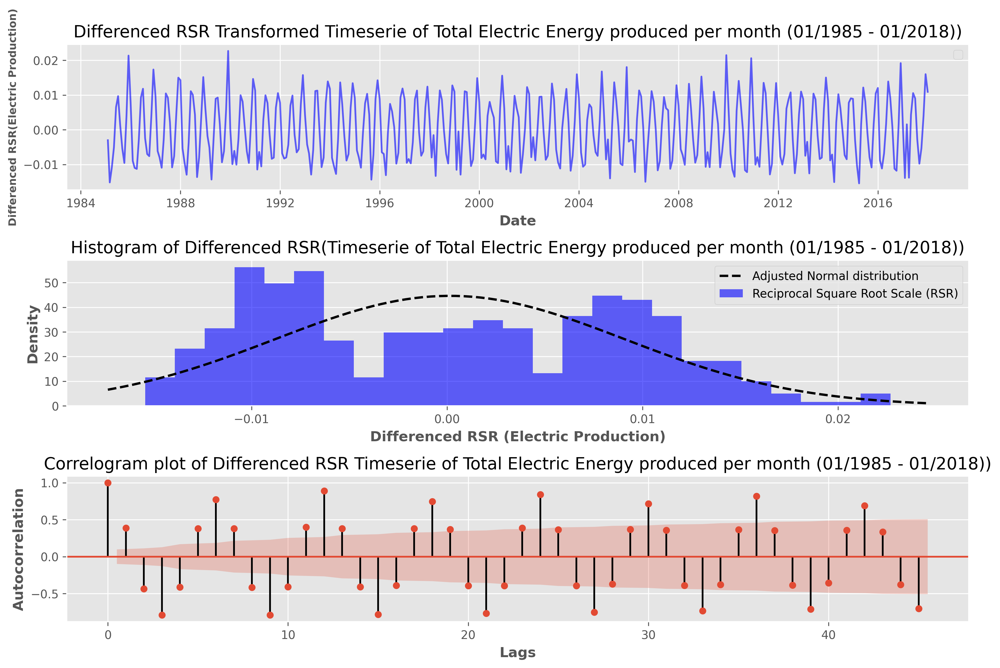

In [ ]:
import numpy as np
from scipy.stats import norm
plt.figure(figsize=(12,8),dpi=300)
plt.subplot(311)
plt.style.use('ggplot')
plt.plot(ddft['rec_sqr'].diff().dropna(),color='blue')
plt.ylabel("RSR(Electric Production)",fontweight='bold', size = 9)
plt.xlabel("Date",fontweight='bold', size = 12)
plt.legend(loc='best')
plt.title("Reciprocal Square Root (RSR) Transformed Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

plt.subplot(312)
plt.style.use('ggplot')
ddft['rec_sqr'].diff().dropna().plot.hist(bins=25,color='blue',alpha=0.6,density=True,label='Reciprocal Square Root Scale (RSR)')
plt.ylabel("Density",fontweight='bold', size = 12)
plt.xlabel("RSR (Electric Production)",fontweight='bold', size = 12)
data = ddft['rec_sqr'].diff().dropna()
  
mu, sigma = norm.fit(data)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, sigma)  
plt.plot(x, p,'--', color='black', linewidth=2,label='Adjusted Normal distribution')
plt.legend(loc='best')
plt.title("Histogram of RSR(Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

plt.subplot(313)
plot_acf(dft['rec_sqr'].diff().dropna(), ax=plt.gca(),lags=45)
plt.style.use('ggplot')
plt.ylabel("Autocorrelation",fontweight='bold', size = 12)
plt.xlabel("Lags",fontweight='bold', size = 12)
plt.title("Correlogram plot of RSR Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

#plt.savefig("rec_sq_ts.pdf")
#files.download("rec_sq_ts.pdf") 
plt.show()

No handles with labels found to put in legend.


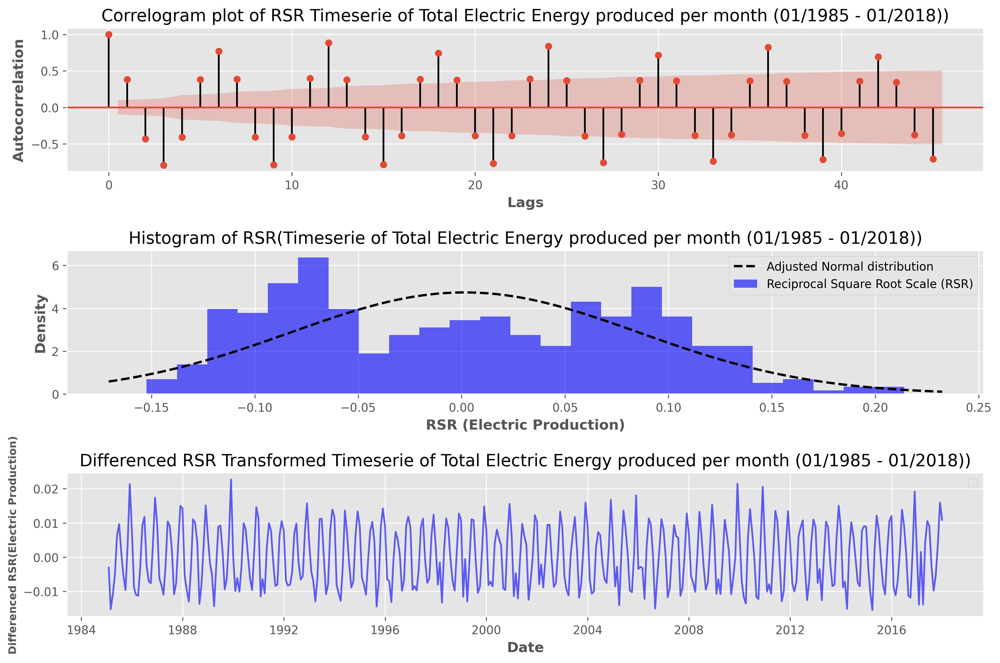

In [ ]:
import numpy as np
from scipy.stats import norm
plt.figure(figsize=(12,8),dpi=300)
plt.subplot(311)
plt.style.use('ggplot')
plt.plot(ddft['log'].diff().dropna(),color='blue')
plt.ylabel("RSR(Electric Production)",fontweight='bold', size = 9)
plt.xlabel("Date",fontweight='bold', size = 12)
plt.legend(loc='best')
plt.title("Reciprocal Square Root (RSR) Transformed Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

plt.subplot(312)
plt.style.use('ggplot')
ddft['log'].diff().dropna().plot.hist(bins=45,color='blue',alpha=0.6,density=True,label='Reciprocal Square Root Scale (RSR)')
plt.ylabel("Density",fontweight='bold', size = 12)
plt.xlabel("RSR (Electric Production)",fontweight='bold', size = 12)
data = ddft['log'].diff().dropna()
  
mu, sigma = norm.fit(data)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, sigma)  
plt.plot(x, p,'--', color='black', linewidth=2,label='Adjusted Normal distribution')
plt.legend(loc='best')
plt.title("Histogram of RSR(Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

plt.subplot(313)
plot_acf(dft['log'].diff().dropna(), ax=plt.gca(),lags=4)
plt.style.use('ggplot')
plt.ylabel("Autocorrelation",fontweight='bold', size = 12)
plt.xlabel("Lags",fontweight='bold', size = 12)
plt.title("Correlogram plot of RSR Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

#plt.savefig("rec_sq_ts.pdf")
#files.download("rec_sq_ts.pdf") 
plt.show()

ORIGINAL SCALE
---

No handles with labels found to put in legend.


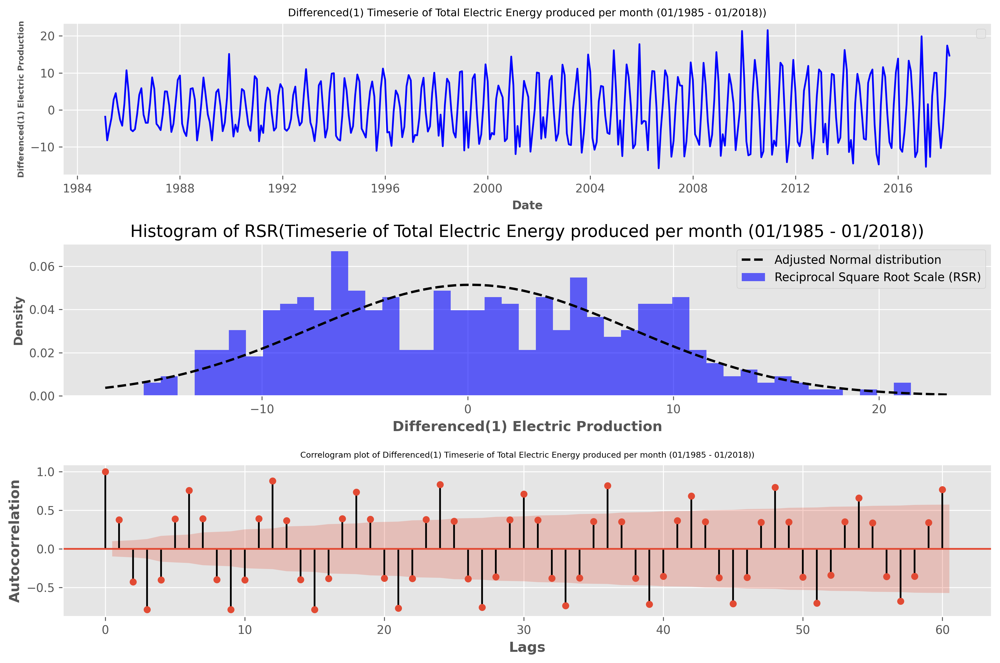

In [ ]:
import numpy as np
from scipy.stats import norm
plt.figure(figsize=(12,8),dpi=300)
plt.subplot(311)
plt.style.use('ggplot')
plt.plot(ddft['energy'].diff().dropna(),color='blue')
plt.ylabel("Differenced(1) Electric Production",fontweight='bold', size = 7)
plt.xlabel("Date",fontweight='bold', size = 10)
plt.legend(loc='best')
plt.title("Differenced(1) Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))",size = 9)
plt.tight_layout()

plt.subplot(312)
plt.style.use('ggplot')
ddft['energy'].diff().dropna().plot.hist(bins=45,color='blue',alpha=0.6,density=True,label='Reciprocal Square Root Scale (RSR)')
plt.ylabel("Density",fontweight='bold', size = 10)
plt.xlabel("Differenced(1) Electric Production",fontweight='bold', size = 12)
data = ddft['energy'].diff().dropna()
  
mu, sigma = norm.fit(data)
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, sigma)  
plt.plot(x, p,'--', color='black', linewidth=2,label='Adjusted Normal distribution')
plt.legend(loc='best')
plt.title("Histogram of RSR(Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))")
plt.tight_layout()

plt.subplot(313)
plot_acf(dft['energy'].diff().dropna(), ax=plt.gca(),lags=60)
plt.style.use('ggplot')
plt.ylabel("Autocorrelation",fontweight='bold', size = 12)
plt.xlabel("Lags",fontweight='bold', size = 12)
plt.title("Correlogram plot of Differenced(1) Timeserie of Total Electric Energy produced per month (01/1985 - 01/2018))",size = 7)
plt.tight_layout()

#plt.savefig("dif_original_scale.pdf")
#files.download("dif_original_scale.pdf") 
plt.show()

In [ ]:
moving_avg = dft.log.rolling(window=12).mean()
dft.log_ma = dft.log - moving_avg
dft.log_ma.dropna(inplace=True)

In [ ]:
d.log.isnull().values.any()
#or
d.log.isnull().values.sum()

0

In [ ]:
d[log

ACF-PACF
---

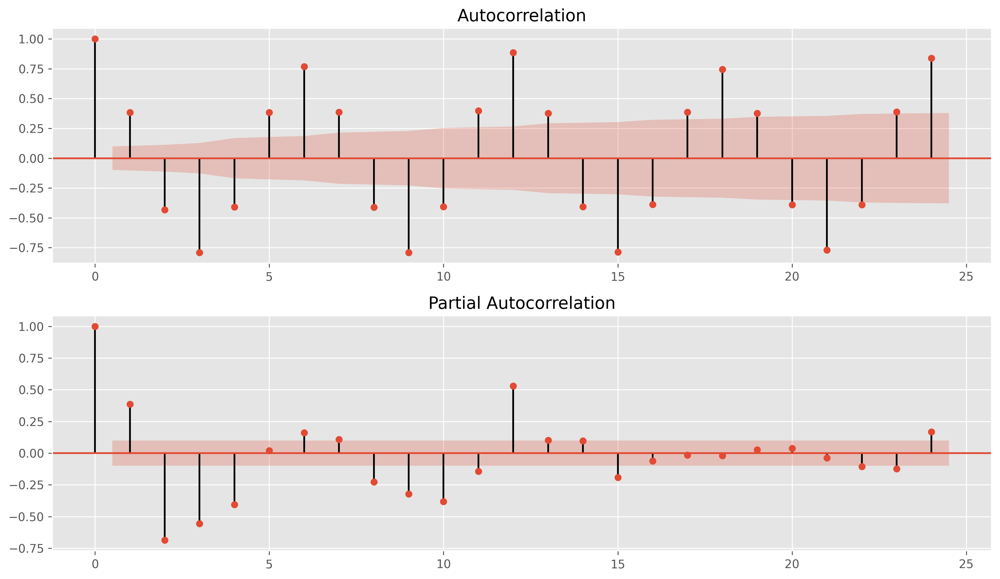

In [ ]:
plt.figure(figsize=(12,7),dpi=300)
plt.subplot(211)
plot_acf(d.log, ax=plt.gca(),lags=24)
plt.style.use('ggplot')
plt.tight_layout()
plt.subplot(212)
plot_pacf(d.log, ax=plt.gca(), lags = 24)
plt.style.use('ggplot')
plt.tight_layout()
# plt.savefig("acfpacf.pdf")
# files.download("acfpacf.pdf") 
plt.show()

ACF PACF AFTER DETREND
--

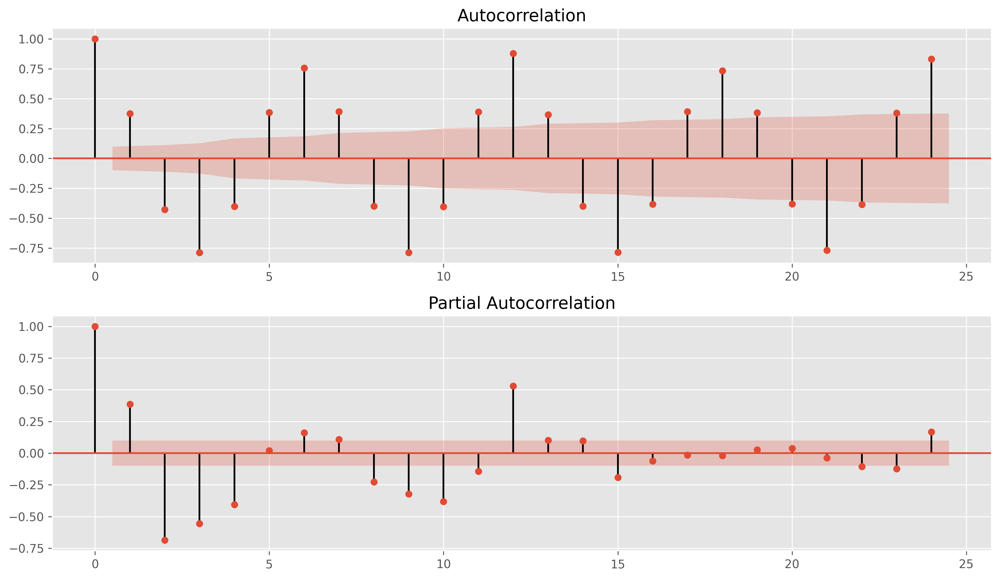

In [ ]:
plt.figure(figsize=(12,7),dpi=300)
plt.subplot(211)
plot_acf(d['energy'], ax=plt.gca(),lags=24)
plt.style.use('ggplot')
plt.tight_layout()
plt.subplot(212)
plot_pacf(d['log'], ax=plt.gca(), lags = 24)
plt.style.use('ggplot')
plt.tight_layout()
# plt.savefig("acfpacf.pdf")
# files.download("acfpacf.pdf") 
plt.show()

FITTING DISTRIBUTION
--

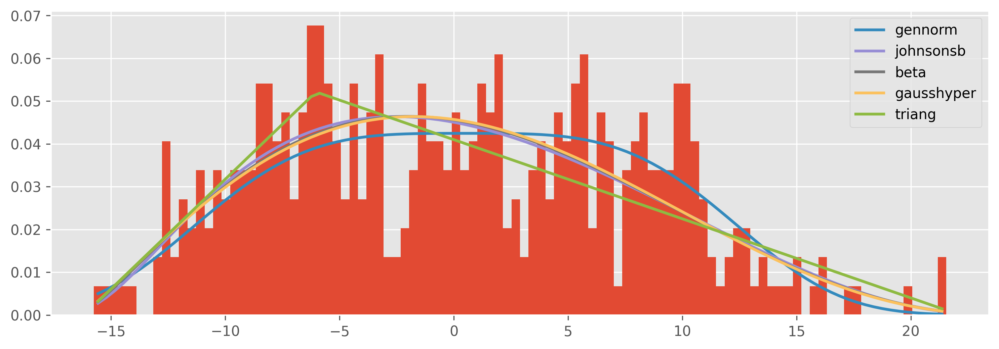

In [ ]:
#fitting distirbution to data
ans=dft['energy'].diff().dropna().values
# We then create the Fitter object
f=Fitter(ans)
plt.figure(figsize=(12,4),dpi=300)
#Loop over distributions and find best parameter to fit the data for each
f.fit()
#Plots the distribution of the data and N=5 best distribution
f.summary()
plt.show()

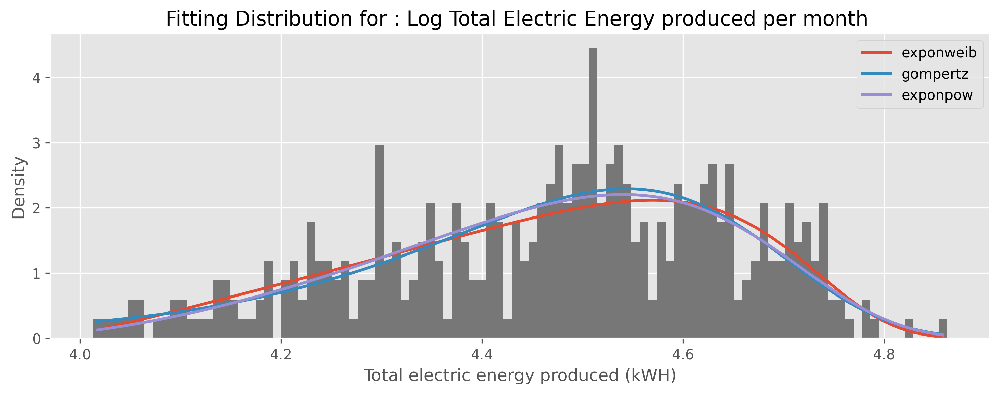

In [ ]:
#Return best fitted distribution and its parameters
f.get_best(method = 'sumsquare_error')
#identifying the parameters of best pdf
f.fitted_param["exponweib"]
#visualization of best distributions for datas
plt.figure(figsize=(12,4),dpi=300)
plt.style.use('ggplot')
#Plots Probability density functions of the distributions
f.plot_pdf(names=None, Nbest=3, lw=2, method='sumsquare_error')
f.hist()
plt.ylabel("Density")
plt.xlabel("Total electric energy produced (kWH)")
plt.legend(loc='best')
plt.title("Fitting Distribution for : Log Total Electric Energy produced per month ")
# plt.savefig("dailyfit.pdf")
# files.download("dailyfit.pdf") 
plt.show()

DECEASONALISE THROUGH DIFFERENCING 
--

In [ ]:
# plot of energy producted through time
plt.figure(figsize=(12,4), dpi=300)
plt.plot(df.energy)
plt.xlabel('Date', size = 12)
plt.ylabel('Electric Production ', size = 12)
plt.title('Timeseries of Total Electric Energy produced per month (01/1985 - 01/2018)', size = 14)
plt.tight_layout()
# plt.savefig("dailytimeserie.pdf")
# files.download("dailytimeserie.pdf") 
plt.show()

In [ ]:

# histogram - kernel density estimator on real values
plt.figure(figsize=(12,4), dpi=300)
plt.subplot(211)
plt.style.use('ggplot')
df.energy.plot.hist( color = 'cornflowerblue')
plt.plot(df.energy, normal_distribution_curve, color = "orange") #plotting normal curve 
plt.ylabel("Observations")
plt.xlabel("Total electric energy produced (kWH)")
plt.ylim()
#plt.xlim(df.energy.min()-40,df.energy.max()+10)
plt.legend(loc='best')
plt.title("Histogram of Total Electric Energy produced per month ")
plt.tight_layout()
#create density plot
plt.subplot(212)
plt.style.use('ggplot')
df.energy.plot.kde()
plt.xlim(df.energy.min()-10,df.energy.max()+10)
plt.ylabel("Density")
plt.xlabel("Total electric energy produced (kWH)")
plt.legend(loc='best')
plt.title("Kernel Density Estimator of Total Electric Energy produced per month ")
plt.tight_layout()
# plt.savefig("dailyhist.pdf")
# files.download("dailyhist.pdf") 
plt.show()

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARMA, ARIMA
# naive decomposition

decomposition = seasonal_decompose(dft['log'].diff().dropna())

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid


plt.figure(figsize=(12,7),dpi=300)

plt.subplot(411)
plt.plot(dft['log'].diff().dropna(), label='Log')
plt.title("Log of Total Energy produced per month")
plt.ylabel("kWH")
plt.xlabel("Time")
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout()

plt.subplot(412)
plt.plot(trend, label='Trend')
plt.title("Trend of total Energy produced per month")
plt.ylabel("kWH")
plt.xlabel("Time")
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout()

plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.title("Seasonality of total Energy produced per month")
plt.ylabel("kWH")
plt.xlabel("Time")
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout()

plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.title("Residuals of total Energy produced per month")
plt.ylabel("kWH")
plt.xlabel("Time")
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout()

# plt.savefig("dailyedecomp.pdf")
# files.download("dailyedecomp.pdf") 

plt.show()

DECOMPOSITION PLOT
--

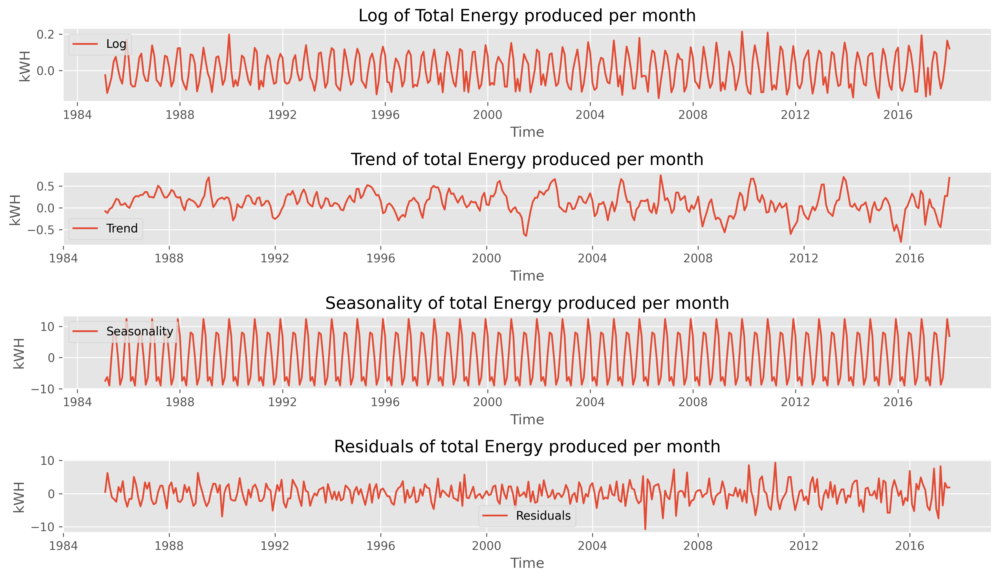

In [ ]:
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARMA, ARIMA
# naive decomposition

decomposition = seasonal_decompose(dft['energy'].diff().dropna())

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid


plt.figure(figsize=(12,7),dpi=300)

plt.subplot(411)
plt.plot(dft['energy'].diff().dropna(), label='Log')
plt.title("Log of Total Energy produced per month")
plt.ylabel("kWH")
plt.xlabel("Time")
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout()

plt.subplot(412)
plt.plot(trend, label='Trend')
plt.title("Trend of total Energy produced per month")
plt.ylabel("kWH")
plt.xlabel("Time")
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout()

plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.title("Seasonality of total Energy produced per month")
plt.ylabel("kWH")
plt.xlabel("Time")
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout()

plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.title("Residuals of total Energy produced per month")
plt.ylabel("kWH")
plt.xlabel("Time")
plt.style.use('ggplot')
plt.legend(loc='best')
plt.tight_layout()

# plt.savefig("dailyedecomp.pdf")
# files.download("dailyedecomp.pdf") 

plt.show()

# FORECASTING MODELS

PERSISTENCE MODEL
--

we want to develop a model to predict the last 6 MONTHS of electric production in the dataset given all prior observations. The simplest model that we could use to make predictions would be to persist the last observation. We can call this a persistence model and it provides a baseline of performance for the problem that we can use for comparison with an autoregression model.

AUTOREGRESSIVE MODEL 
--

In [8]:
ar_values = dft['log']
train = ar_values[:385] 
test = ar_values[385:]

start=len(train)
end=len(train)+len(test)-1

p_params = range(0,11, 1)
d_params = [0]
q_params = [0]

ar_best=950000000000000

for p in p_params:
  #for d in d_params:
    #for q in q_params:
      try:
        model = ARIMA(train, order=(p,0,0))
        AR_model = model.fit()
        aic = AR_model.aic
        predictions, st_er, conf = AR_model.forecast(12, alpha=0.05)  # 95% conf
        ar_score = sqrt(mean_squared_error(test,predictions))#RMSE
        if aic < ar_best :
          best_model=AR_model
          ar_best=aic#change to ar_score if selection by rmse
          m_aic=aic
          best_p=p
          #best_d=d
          best_pred=predictions
      except:
        continue


print('WITH AIC (',round(ar_best,5),') BEST AR MODEL IS ORDER OF:',best_p,0,0)
#print('BEST AR MSE: {}'.format(round(ar_best,5)))

WITH AIC ( -1422.61612 ) BEST AR MODEL IS ORDER OF: 10 0 0


In [30]:
from numpy.ma.core import sqrt
ar_values = dft.log
train = ar_values[:385] 
test = ar_values[385:]

# Build AR Model
# model = ARIMA(train, order=(10,0,0) BY AIC AND RMSE)  
model = ARIMA(train, order=(10, 0, 0))  
fitted = model.fit(disp=-1)  

# Forecast
forecast, st_er, conf = fitted.forecast(12, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(forecast, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

test=np.exp(test)
fc_series=np.exp(fc_series)
lower_series=np.exp(lower_series)
upper_series=np.exp(upper_series)

aic=fitted.aic
ar_rmse=sqrt(mean_squared_error(test,fc_series))
print("AIC = ",aic)
print("RMSE = ",ar_rmse)

AIC =  -1422.616124821199
RMSE =  6.090359608439605


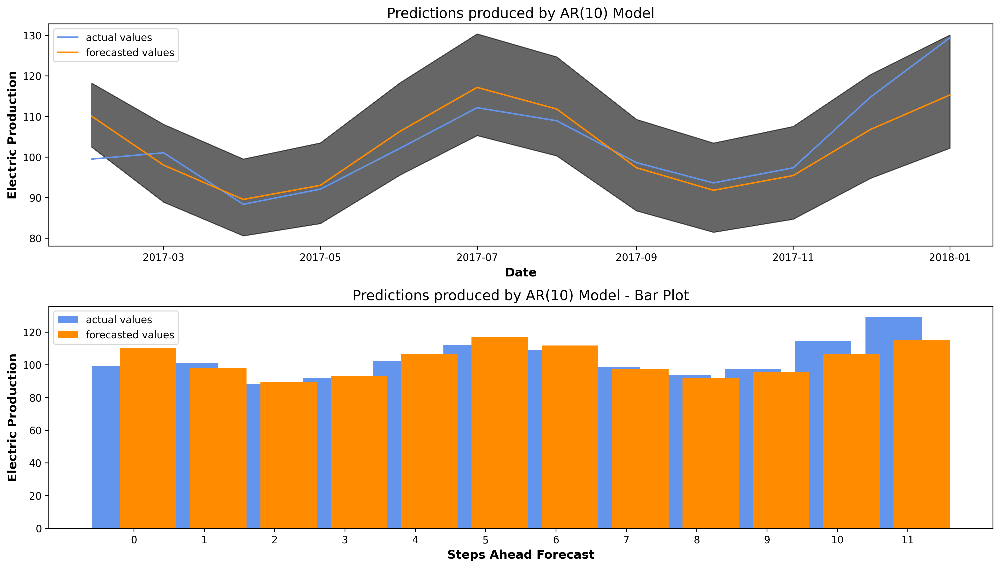

In [34]:
plt.figure(figsize = (14,8),dpi=300)

plt.subplot(211)
plt.plot(test, label = "actual values", color = "cornflowerblue")
plt.plot(fc_series,label = "forecasted values", color='darkorange')
plt.xticks(test.index.values,rotation=315)
#plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.6)
plt.title("Predictions produced by AR(10) Model", size = 14)
plt.ylabel("Electric Production",fontweight='bold', size = 12)
plt.xlabel("Date",fontweight='bold', size = 12)
plt.legend(loc='best')
plt.legend(loc = 'upper left')
plt.tight_layout()

plt.subplot(212)

X=test.index
X_axis = np.arange(len(test.index))
plt.bar(X_axis-0.2,test, color ='cornflowerblue',width=0.4,label = "actual values")
plt.bar(X_axis+0.2,fc_series, color ='darkorange',width=0.4,label = "forecasted values")
plt.ylabel("Electric Production",fontweight='bold', size = 12)
plt.xlabel("Steps Ahead Forecast",fontweight='bold', size = 12)
x=[0,1,2,3,4,5,6,7,8,9,10,11]
plt.xticks(x,labels=['1','2','3','4','5','6','7','8','9','10','11','12'])
plt.legend(loc='best')
plt.title("Predictions produced by AR(10) Model - Bar Plot",size = 14)
plt.tight_layout()


plt.show()

MA MODEL
--

In [42]:
ma_values = dft['log']
train = ma_values[:385] 
test = ma_values[385:]

start=len(train)
end=len(train)+len(test)-1

p_params = 0
d_params = 0
q_params = range(0,11,1)

ma_best=9000000000

#for p in p_params:
  #for d in d_params:
for q in q_params:
  try:
    model = ARIMA(train, order=(0,0,q))
    MA_model = model.fit()
    aic = MA_model.aic
    predictions, st_er, conf = MA_model.forecast(12, alpha=0.05)  # 95% conf
    ma_score = sqrt(mean_squared_error(test,predictions))#RMSE
    if aic < ma_best :
      best_model=MA_model
      ma_best=aic#change to ma_score if selection by rmse
      m_aic=aic
      best_q=q
  except:
    continue

print('WITH AIC (',m_aic,') BEST MA MODEL IS ORDER OF:',0,0,best_q)
print('BEST MA MSE: {}'.format(round(ma_best,4)))

WITH AIC ( -638.4630560837547 ) BEST MA MODEL IS ORDER OF: 0 0 1
BEST MA MSE: -638.4631


In [44]:
from numpy.ma.core import sqrt
ma_values = dft.log
train = ma_values[:385] 
test = ma_values[385:]

# Build AR Model
# model = ARIMA(train, order=(10,0,0) BY AIC AND RMSE)  
model = ARIMA(train, order=(0, 0, 1))  
fitted = model.fit(disp=-1)  

# Forecast
forecast, st_er, conf = fitted.forecast(12, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(forecast, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

test=np.exp(test)
fc_series=np.exp(fc_series)
lower_series=np.exp(lower_series)
upper_series=np.exp(upper_series)

aic=fitted.aic
ma_rmse=sqrt(mean_squared_error(test,fc_series))
print("AIC = ",aic)
print("RMSE = ",ma_rmse)

AIC =  -638.4630560837547
RMSE =  19.213975029737057


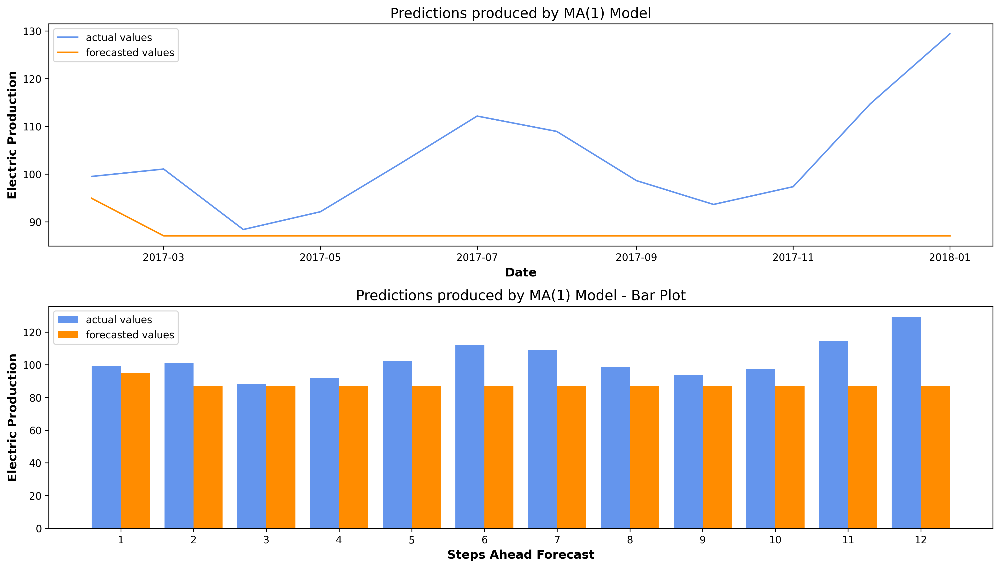

In [47]:
plt.figure(figsize = (14,8),dpi=300)

plt.subplot(211)
plt.plot(test, label = "actual values", color = "cornflowerblue")
plt.plot(fc_series,label = "forecasted values", color='darkorange')
plt.xticks(test.index.values,rotation=315)
#plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.6)
plt.title("Predictions produced by MA(1) Model", size = 14)
plt.ylabel("Electric Production",fontweight='bold', size = 12)
plt.xlabel("Date",fontweight='bold', size = 12)
plt.legend(loc='best')
plt.legend(loc = 'upper left')
plt.tight_layout()

plt.subplot(212)

X=test.index
X_axis = np.arange(len(test.index))
plt.bar(X_axis-0.2,test, color ='cornflowerblue',width=0.4,label = "actual values")
plt.bar(X_axis+0.2,fc_series, color ='darkorange',width=0.4,label = "forecasted values")
plt.ylabel("Electric Production",fontweight='bold', size = 12)
plt.xlabel("Steps Ahead Forecast",fontweight='bold', size = 12)
x=[0,1,2,3,4,5,6,7,8,9,10,11]
plt.xticks(x,labels=['1','2','3','4','5','6','7','8','9','10','11','12'])
plt.legend(loc='best')
plt.title("Predictions produced by MA(1) Model - Bar Plot",size = 14)
plt.tight_layout()


plt.show()

ARMA MODEL
--

In [51]:
arma_values = dft['log']
train = arma_values[:385] 
test = arma_values[385:]

start=len(train)
end=len(train)+len(test)-1

p_params = range(0,10,1)
d_params = 0
q_params = range(0,10,1)

arma_best=9000000000

for p in p_params:
  #for d in d_params:
  for q in q_params:
    try:
      model = ARIMA(train, order=(p,0,q))
      ARMA_model = model.fit()
      aic = ARMA_model.aic
      predictions, st_er, conf = ARMA_model.forecast(12, alpha=0.05)  # 95% conf
      arma_score = sqrt(mean_squared_error(test,predictions))#RMSE
      print(p,0,q," with RMSE = ",arma_score)
      if arma_score < arma_best :
        best_model=ARMA_model
        arma_best=arma_score#change to aic if selection by aic
        m_aic=aic
        best_p=p
        best_q=q
    except:
      continue

print('WITH AIC (',m_aic,') BEST MA MODEL IS ORDER OF:',best_p,0,best_q)
print('RMSE: {}'.format(round(arma_best,4)))

0 0 0  with RMSE =  0.19384717799970924
0 0 1  with RMSE =  0.19048340758076746
1 0 0  with RMSE =  0.13951248034827862
1 0 1  with RMSE =  0.15960992519715145
1 0 2  with RMSE =  0.10310199877463481
2 0 0  with RMSE =  0.18545710964918502
2 0 1  with RMSE =  0.17651880062724903
2 0 2  with RMSE =  0.10457823250867582
WITH AIC ( -1020.5692477623654 ) BEST MA MODEL IS ORDER OF: 1 0 2
RMSE: 0.1031


In [58]:
from numpy.ma.core import sqrt
ma_values = dft.log
train = ma_values[:385] 
test = ma_values[385:]

# Build AR Model
# model = ARIMA(train, order=(10,0,0) BY AIC AND RMSE)  
model = ARIMA(train, order=(10, 0, 10))  
fitted = model.fit(disp=-1)  

# Forecast
forecast, st_er, conf = fitted.forecast(12, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(forecast, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

test=np.exp(test)
fc_series=np.exp(fc_series)
lower_series=np.exp(lower_series)
upper_series=np.exp(upper_series)

aic=fitted.aic
arma_rmse=sqrt(mean_squared_error(test,fc_series))
print("AIC = ",aic)
print("RMSE = ",arma_rmse)

AIC =  -1631.7181958550816
RMSE =  5.933316593553648


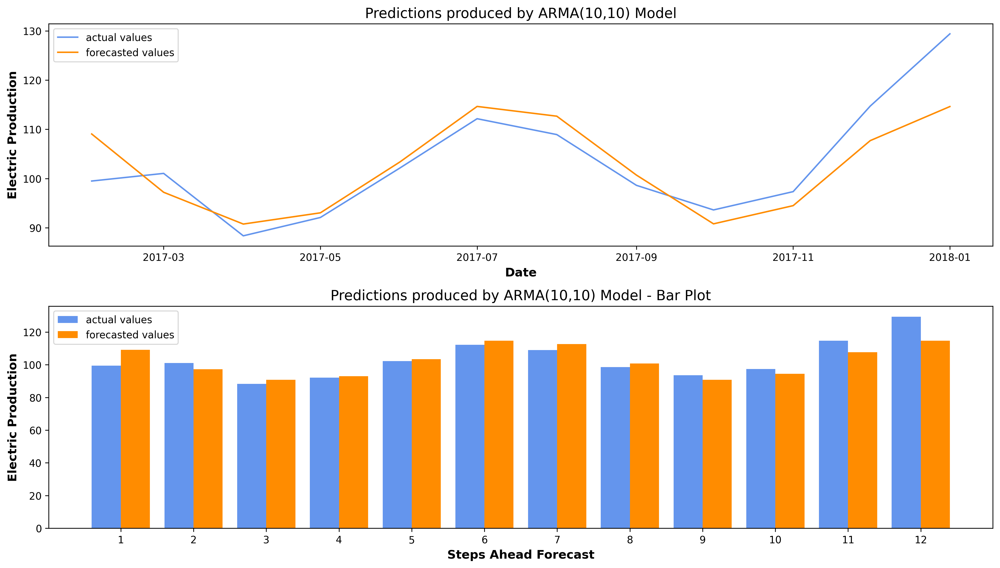

In [55]:
plt.figure(figsize = (14,8),dpi=300)

plt.subplot(211)
plt.plot(test, label = "actual values", color = "cornflowerblue")
plt.plot(fc_series,label = "forecasted values", color='darkorange')
plt.xticks(test.index.values,rotation=315)
#plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.6)
plt.title("Predictions produced by ARMA(10,10) Model", size = 14)
plt.ylabel("Electric Production",fontweight='bold', size = 12)
plt.xlabel("Date",fontweight='bold', size = 12)
plt.legend(loc='best')
plt.legend(loc = 'upper left')
plt.tight_layout()

plt.subplot(212)

X=test.index
X_axis = np.arange(len(test.index))
plt.bar(X_axis-0.2,test, color ='cornflowerblue',width=0.4,label = "actual values")
plt.bar(X_axis+0.2,fc_series, color ='darkorange',width=0.4,label = "forecasted values")
plt.ylabel("Electric Production",fontweight='bold', size = 12)
plt.xlabel("Steps Ahead Forecast",fontweight='bold', size = 12)
x=[0,1,2,3,4,5,6,7,8,9,10,11]
plt.xticks(x,labels=['1','2','3','4','5','6','7','8','9','10','11','12'])
plt.legend(loc='best')
plt.title("Predictions produced by ARMA(10,10) Model - Bar Plot",size = 14)
plt.tight_layout()


plt.show()

ARIMA MODEL VOL2 
--

In [62]:
arima_values = dft['log']
train = arima_values[:385] 
test = arima_values[385:]

start=len(train)
end=len(train)+len(test)-1

p_params = range(0,3,1)
d_params = [0,1]
q_params = range(0,3,1)

arima_best=9000000000

for p in p_params:
  #for d in d_params:
    for q in q_params:
      try:
        model = ARIMA(train, order=(p,1,q))
        ARIMA_model = model.fit()
        aic = ARIMA_model.aic
        predictions, st_er, conf = ARMA_model.forecast(12, alpha=0.05)  # 95% conf
        arima_score = mean_squared_error(test,predictions)
        print(p,1,q," with RMSE = ",arima_score)
        if aic < arima_best:
          best_model=model
          arima_best=aic
          m_aic=aic
          best_p=p
          best_q=q
      except:
        continue

print('WITH MINIMUM AIC (',m_aic,') BEST ARIMA MODEL IS ORDER OF:',best_p,1,best_q)
print('RMSE: {}'.format(round(arima_best,4)))

0 1 0  with RMSE =  0.01093660671463866
0 1 1  with RMSE =  0.01093660671463866
1 1 0  with RMSE =  0.01093660671463866
1 1 1  with RMSE =  0.01093660671463866
2 1 0  with RMSE =  0.01093660671463866
2 1 2  with RMSE =  0.01093660671463866
WITH MINIMUM AIC ( -1457.3729931944526 ) BEST ARIMA MODEL IS ORDER OF: 2 1 2
RMSE: -1457.373


In [84]:
from numpy.ma.core import sqrt
ma_values = dft.log
train = ma_values[:385] 
test = ma_values[385:]

# Build AR Model
# model = ARIMA(train, order=(10,0,0) BY AIC AND RMSE)  
model = ARIMA(train, order=(8, 1, 6))  
fitted = model.fit(disp=-1)  

# Forecast
forecast, st_er, conf = fitted.forecast(12, alpha=0.05)  # 95% conf

# Make as pandas series
fc_series = pd.Series(forecast, index=test.index)
lower_series = pd.Series(conf[:, 0], index=test.index)
upper_series = pd.Series(conf[:, 1], index=test.index)

test=np.exp(test)
fc_series=np.exp(fc_series)
lower_series=np.exp(lower_series)
upper_series=np.exp(upper_series)

aic=fitted.aic
arma_rmse=sqrt(mean_squared_error(test,fc_series))
print("AIC = ",aic)
print("RMSE = ",arma_rmse)

AIC =  -1615.5732015728145
RMSE =  4.982712263220486


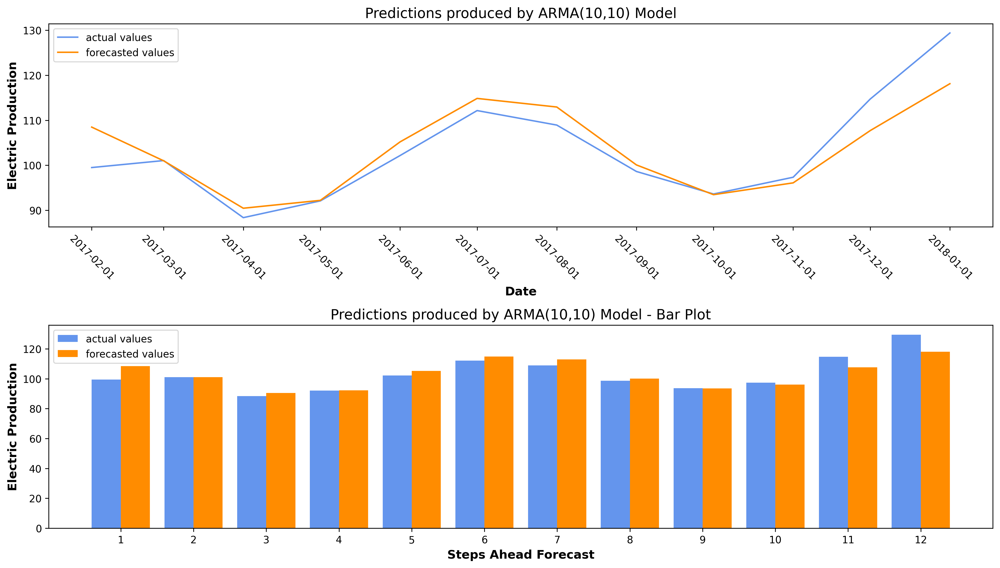

In [85]:
import matplotlib.dates as mdates
plt.figure(figsize = (14,8),dpi=300)

plt.subplot(211)
plt.plot(test, label = "actual values", color = "cornflowerblue")
plt.plot(fc_series,label = "forecasted values", color='darkorange')
plt.xticks(test.index.values,rotation=315)
#plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.6)
plt.title("Predictions produced by ARIMA(8,1,6) Model", size = 14)
plt.ylabel("Electric Production",fontweight='bold', size = 12)
plt.xlabel("Date",fontweight='bold', size = 12)
plt.legend(loc='best')
plt.legend(loc = 'upper left')
plt.tight_layout()

plt.subplot(212)

X=test.index
X_axis = np.arange(len(test.index))
plt.bar(X_axis-0.2,test, color ='cornflowerblue',width=0.4,label = "actual values")
plt.bar(X_axis+0.2,fc_series, color ='darkorange',width=0.4,label = "forecasted values")
plt.ylabel("Electric Production",fontweight='bold', size = 12)
plt.xlabel("Steps Ahead Forecast",fontweight='bold', size = 12)
x=[0,1,2,3,4,5,6,7,8,9,10,11]
plt.xticks(x,labels=['1','2','3','4','5','6','7','8','9','10','11','12'])
plt.legend(loc='best')
plt.title("Predictions produced by ARIMA(8,1,6) Model - Bar Plot",size = 14)
plt.tight_layout()


plt.show()

SARIMA MODEL VOL2
--

In [ ]:
sarima_values = dft['log'].values
train = sarima_values[:385] 
test = sarima_values[385:]

start=len(train)
end=len(train)+len(test)-1

p_params = range(0,3,1)
d_params = range(0,2,1)
q_params = range(0,3,1)

P_params = range(0,3,1)
D_params = range(0,2,1)
Q_params = range(0,4,1)


sarima_best=9000000000

for p in p_params:
  for d in d_params:
    for q in q_params:
      for P in P_params:
        for D in D_params:
          for Q in Q_params:
            try:
              model = SARIMAX(train, order=(p,1,q) ,seasonal_order=(P,1,Q,12) )
              SARIMA_model = model.fit()
              predictions=SARIMA_model.predict(start=start, end=end, dynamic=False)
              sarima_score = mean_squared_error(test,predictions)
              if sarima_score < sarima_best:
                best_model=model
                sarima_best=sarima_score
                best_p=p
                best_q=q
                best_d=d
                best_P=P
                best_Q=Q
                best_D=D
                best_pred=predictions
            except:
              continue

print('BEST SARIMA MSE: {}'.format(round(sarima_best,4)))
print('BEST SARIMA MODEL IS ORDER OF:','(',best_p,best_d,best_q,')','(',best_P,best_D,best_Q,')' )

In [ ]:
model = SARIMAX(train, order=(p,d,q) ,seasonal_order=(P,D,Q,12) )
              SARIMA_model = model.fit()
              predictions=SARIMA_model.predict(start=start, end=end, dynamic=False)
              sarima_score = mean_squared_error(test,predictions)

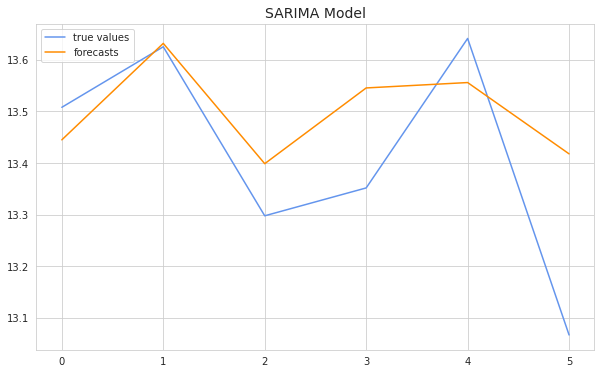

In [ ]:
plt.figure(figsize = (10,6))
plt.plot(test, label = "true values", color = "cornflowerblue")
plt.plot(best_pred,label = "forecasts", color='darkorange')
plt.title("SARIMA Model", size = 14)
plt.legend(loc = 'upper left')
plt.show()

# OVERVIEW


Mean Squared Errors
--

In [ ]:
errors = pd.DataFrame()
errors["Model"] = ["Persistence", "Autoregression", "Moving Average", "ARIMA","SARIMA"]
errors["MSE"] = [persistence_score, ar_score, ma_score, arima_best,sarima_best]
errors = errors.sort_values("MSE", ascending = True, ignore_index = True)
errors.index = errors.Model
del errors["Model"]

def coloring_bg(s, min_, max_, cmap='Reds', low=0, high=0):
    color_range = max_ - min_
    norm = colors.Normalize(min_ - (color_range * low), max_ + (color_range * high))
    normed = norm(s.values)
    c = [colors.rgb2hex(x) for x in plt.cm.get_cmap(cmap)(normed)]
    return ['background-color: %s' % color for color in c]

errors.style.apply(coloring_bg,min_ =errors.min().min(),
               max_ = errors.max().max(), low = 0.1, high = 0.85)